### Model and Results

In [2]:
# LIBS

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import warnings
# warnings.filterwarnings('ignore')
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential, layers, callbacks
from tensorflow.keras.layers import Dense, LSTM, Dropout, GRU
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
# import statsmodels.api as sm
# from pmdarima import auto_arima

from sklearn.model_selection import GridSearchCV

register_matplotlib_converters()
sns.set_style("darkgrid")

plt.rc("figure", figsize=(16, 6))
plt.rc("font", size=13)

from matplotlib.pyplot import figure

figure(figsize = (16, 6), dpi = 100)

2024-04-03 23:31:25.298895: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-03 23:31:25.773444: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-03 23:31:25.779302: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-03 23:31:27.926154: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


<Figure size 1600x600 with 0 Axes>

<Figure size 1600x600 with 0 Axes>

In [3]:
# Hyperparams setting
# Round 2 (official) =================
learning_rate = 0.00001
patience = 5
batch_size = 32
epochs = 150
val_split = 0.2
rest_best = True
###========================

In [4]:
# Main functions

# Create input dataset
# The input shape should be [samples, time steps, features
def create_dataset (X, look_back = 3):
    Xs, ys = [], []
    
    for i in range(len(X)-look_back):
        v = X[i:i+look_back]
        Xs.append(v)
        ys.append(X[i+look_back])
        
    return np.array(Xs), np.array(ys)

######################################################################################################################################################
# Create GRU model

def create_gru(units, train): #train argument  - units: quantidade de valores passados para passar para o futuro(?) / train: dados de treinamento
    model = Sequential() #inicializa um modelo sequencial usando a classe sequential()
    
    # Old Config
    #adiciona uma cmada GRU ao modelo, com 64 camadas, retornando os valores para o proximo neuronio, e a forma da entrada é determinada pela forma do conjunto de dados de treinamento
    model.add(GRU(units = units, return_sequences = True, input_shape = [train.shape[1], train.shape[2]]))
    
    # Hidden layer
    #adiciona outra camada de modelo GRU com 64 unidades, ela não retorna sequencias e é a ultima camada da pilha 
    model.add(GRU(units = units))   

    # model.add(Dropout(0.2))
    #adiciona uma cmada densa (totalmente conectada) com uma unica unidade de saida - previsão final
    model.add(Dense(1))

    #Compile model
    #compila o modelo, definindo a função de perda como a raiz quadrada do erro quadratico medio, uma taxa de aprendizagem (quanto maior, pior) 
    #e usa a raiz quadrada do erro quadratico medio como metrica
    model.compile(loss=MeanSquaredError(), optimizer = Adam(learning_rate=learning_rate), metrics=[RootMeanSquaredError()])
   
    return model

# Create LSTM model
def create_lstm(units, train): #train argument / units: quantidade de valores passados para passar para o futuro(?) / train: dados de treinamento
    model = Sequential() #inicializa um modelo sequencial usando a classe sequential()
    
    # Old Config
    #adiciona uma cmada LSTM ao modelo, com 64 camadas, retornando os valores para o proximo neuronio , e a forma da entrada é determinada pela forma do conjunto de dados de treinamento
    model.add(LSTM(units = units, return_sequences = True, input_shape = [train.shape[1], train.shape[2]]))
    
    # Hidden layer
    #adiciona outra camada de modelo LSTM com 64 unidades, ela não retorna sequencias e é a ultima camada da pilha 
    model.add(LSTM(units = units)) 

    # model.add(Dropout(0.2))
    #adiciona uma cmada densa (totalmente conectada) com uma unica unidade de saida - previsao final
    model.add(Dense(1))
    
    #Compile model
    #compila o modelo, definindo a funcção de perda como a raiz quadrada do erro quadratico medio, uma taxa de aprendizagem (quanto maior, pior) 
    #e usa a raiz quadrada do erro quadratico medio como metrica
    model.compile(loss=MeanSquaredError(), optimizer = Adam(learning_rate=learning_rate), metrics=[RootMeanSquaredError()])
    
    return model
#treinamento do modelo
def fit_model(model, xtrain, ytrain, model_name): #model: modelo de rede neural a ser treinado (GRU, LSTM), xtrain e ytrain sao dados d entrada e saida do treinamento, model_name é a string com o nome do modelo
    #monitora a val_loss(monitor), se em 5 (patience) epocas não houver melhora, ele para o treinamento. diminui o tempo do treinamento, restore_best_weights guarda o melhor desempenho durante o treinamento.
    early_stop = keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = patience, restore_best_weights=rest_best)
    #treina o modelo usando os dados de entrada e saída fornecidos;
    #ajusta o modelo aos dados de treinamento por um número de épocas especificado (epochs=5);
    #usa 20% dos dados de treinamento como conjunto de validação;
    #O treinamento é feito em lotes de tamanho 32 (batch_size=32)
    #os dados de treinamento são embaralhados antes de cada época (shuffle=True)
    #callbacks define quando para o treinamento de acordo com o comando anterior 
    history = model.fit(xtrain, ytrain, epochs = epochs, validation_split = val_split, batch_size = batch_size, shuffle = True, callbacks=[early_stop])
    
    print('\n\nTREINAMENTO: ' + model_name)
    return history
########################################### plote dos graficos de treinamento ###################################################################################
# Plot train loss and validation loss
def plot_loss (history, model_name, link):
    plt.figure(figsize = (15, 6), dpi=100)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Train vs Validation Loss for '+' '+link + ' '+ model_name)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train loss', 'Validation loss'], loc='upper right')

def plot_rmse (history, model_name, link):
    plt.figure(figsize = (15, 6), dpi=100)
    plt.plot(history.history['rmse'])
    plt.plot(history.history['val_rmse'])
    plt.title('Model Train vs RMSE for '+' '+link + ' '+ model_name)
    plt.ylabel('rmse')
    plt.xlabel('Epoch')
    plt.legend(['Train rmse', 'Validation loss'], loc='upper right')
################################################################################################################################################################
# Make prediction
def prediction(model, xtest, ytest, myscaler, model_name, link): #model: modelo de rede neural treinado, xtest e ytest: dados de entrada e saida de teste,
    #myscaler: objeto que inverte a escala das predições, model_name: string com o nome do modelo, e link: verificar o que é 
    prediction = model.predict(xtest) #realiza predições usando o modelo fornecido nos dados de entrada de teste
    prediction = myscaler.inverse_transform(prediction) #Inverte a escala das predições usando o objeto myscaler

    # dataframe_prediction = pd.DataFrame(data={'Predições':prediction.flatten()})

    dataframe_prediction = pd.DataFrame(data={'Prediction':prediction.flatten(), 'Test':ytest.flatten()})

    dataframe_prediction.to_csv('../../graficos/predicoes/round_2/valores-predicao/prediction '+model_name+' '+link+'.csv')
    
    return prediction

# Plot test data vs prediction
def plot_future(predictionGRU, predictionLSTM, y_test, link):
    
    plt.figure(figsize=(15, 6), dpi=100)
    
    range_future = len(y_test)

    plt.plot(np.arange(range_future), np.array(y_test), label='Test data')
    plt.plot(np.arange(range_future), np.array(predictionGRU), label='GRU')
    plt.plot(np.arange(range_future), np.array(predictionLSTM), label='LSTM')

    # dict_to_dataframe_prediction = {
    #     # "range_future": np.arange(range_future),
    #     f"prediction{model_name}": np.array(prediction.squeeze())
    # }
    
    plt.title('Test data vs prediction for '+ link)
    plt.legend(loc='upper left')
    plt.xlabel('Time')
    plt.ylabel('Mbis/s')

    #Tenta salvar a fig
    save_path = '../../graficos/predicoes/round_2/graficos/'+link+'.png'
    try:
        plt.savefig(save_path)
        print(f"A figura foi salva com sucesso em: {save_path}")
    except Exception as e:
        print(f"Erro ao salvar a figura: {e}")

    plt.show()
    
# Calculate MAE and RMSE
def evaluate_prediction(predictions, actual, model_name):
    errors = predictions - actual
    mse = np.square(errors).mean()
    rmse = np.sqrt(mse)
    mae = np.abs(errors).mean()
    print(model_name + ':')
    print('Mean Absolute Error: {:.4f}'.format(mae))
    print('Root Mean Square Error: {:.4f}'.format(rmse))
    print('')

    return rmse, mae, model_name

def bits_para_megabits(df, col_vaz):
    # Dados em MegaBits/s e fill
    df[col_vaz] = df[col_vaz]/1000000
    df[col_vaz] = df[col_vaz].replace(-1, df[col_vaz].mean())
    df[col_vaz] = df[col_vaz].fillna(df[col_vaz].mean())

    return df
                
def visualizacao_series(df, col_vazao, titulo):
    df[col_vazao].plot(figsize=(18,6))
    plt.title(titulo)
    plt.ylabel('Vazao (Mbits/s)')
    plt.legend() 
    plt.show()
#calcular media dia repetido
def calcular_media_dia(dataframe, col_data, col_vazao):
    # Ordena o DataFrame pelo campo 'Data'
    dataframe = dataframe.sort_values(by=[col_data])
    
    # Inicializa variáveis para rastrear o dia atual e os valores para calcular a média
    dia_atual = None
    valores_para_media = []
    
    # Função para calcular a média e substituir os valores '-1'
    def calcular_media_e_substituir():
        if len(valores_para_media) > 0:
            media = np.mean(valores_para_media)
            for idx in indices_para_substituir:
                dataframe.at[idx, col_vazao] = media
    
    indices_para_substituir = []
    
    # Itera pelas linhas do DataFrame
    for idx, row in dataframe.iterrows():
        data = row[col_data]
        vazao = row[col_vazao]
        
        if dia_atual is None:
            dia_atual = data
            valores_para_media = []
            indices_para_substituir = []
        
        # Verifica se o valor de 'Vazao' é diferente de '-1'
        if vazao != -1:
            valores_para_media.append(vazao)
        else:
            indices_para_substituir.append(idx)
        
        # Verifica se o dia mudou
        if data != dia_atual:
            calcular_media_e_substituir()
            dia_atual = data
            valores_para_media = []
            indices_para_substituir = []
    
    # Calcula a média e substitui os valores para o último dia
    calcular_media_e_substituir()
    
    return dataframe

# def plot_arima(pred, test, col_test, col_arima):

#     plt.plot(test[col_test], label= 'Real')
#     plt.plot(pred[col_arima], label='ARIMA')
#     plt.legend()
#     plt.xlabel('Tempo')
#     plt.ylabel('Vazão (bits/s)')
#     plt.title('Predição ARIMA')

# def create_arima(ts, col_vazao):

#     tamanho = int(len(ts.index) * 0.8)

#     # Split train data and test data
#     train_size = tamanho

#     # train_data = df.WC.loc[:train_size] -----> it gives a series
#     # Do not forget use iloc to select a number of rows
#     train_data = ts[:train_size]
#     test_data = ts[train_size:]

#     modelo_arima = auto_arima(train_data[col_vazao], seasonal=True, stepwise=True)

#     p, d, q = modelo_arima.order

#     modelo_manual = sm.tsa.ARIMA(train_data[col_vazao], order=(p, d, q)).fit()

#     previsoes = modelo_manual.predict(start=1, end=142, dynamic=False)

#     # Ajustar indice
#     test_data = test_data.reset_index(drop=True)
#     previsoes = pd.DataFrame(previsoes.reset_index(drop=True))

#    return previsoes, test_data

#Funções que ainda não estão acabada e não estão sendo utilizadas #############################################################################################
# def create_cnn(units, train):

#     model = Sequential()

#     model.add(Conv1D(units = units, kernel_sieze = 2, return_sequences=True, input_shape = [train.shape[1], train.shape[2]]))

#     model.add(Flatten())

#     model.add(Conv1D(units = units))

#     model.add(Dense(1))

#     model.compile(loss=MeanSquaredError(), optimizer = Adam(learning_rate=0.1), metrics=[RootMeanSquaredError()])

#     return model

###################### interpolacao-linear - preenchido bbr esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
15/15 [==============================] - 4s 47ms/step - loss: 0.8697 - root_mean_squared_error: 0.9326 - val_loss: 0.8590 - val_root_mean_squared_error: 0.9268
Epoch 2/150
15/15 [==============================] - 0s 6ms/step - loss: 0.8500 - root_mean_squared_error: 0.9220 - val_loss: 0.8393 - val_root_mean_squared_error: 0.9162
Epoch 3/150
15/15 [==============================] - 0s 6ms/step - loss: 0.8306 - root_mean_squared_error: 0.9114 - val_loss: 0.8201 - val_root_mean_squared_error: 0.9056
Epoch 4/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8115 - root_mean_squared_error: 0.9008 - val_loss: 0.8010 - val_root_mean_squared_error: 0.8950
Epoch 5/150
15/15 [==============================] - 0s 7ms/step - loss: 0.7926 - root_mean_squared_error: 0.8903 - val_loss: 0.7822 - val_root_mean_squared_error: 0.8844
Epoch 6/150
15/15 [=====

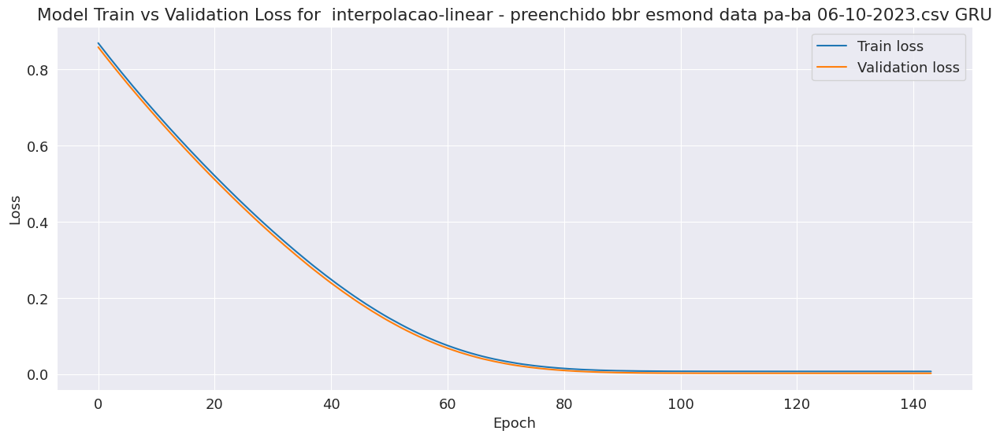

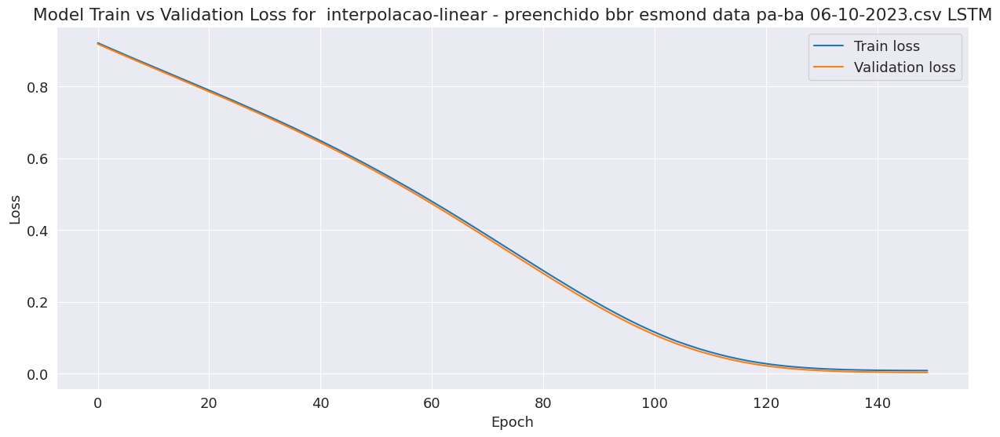

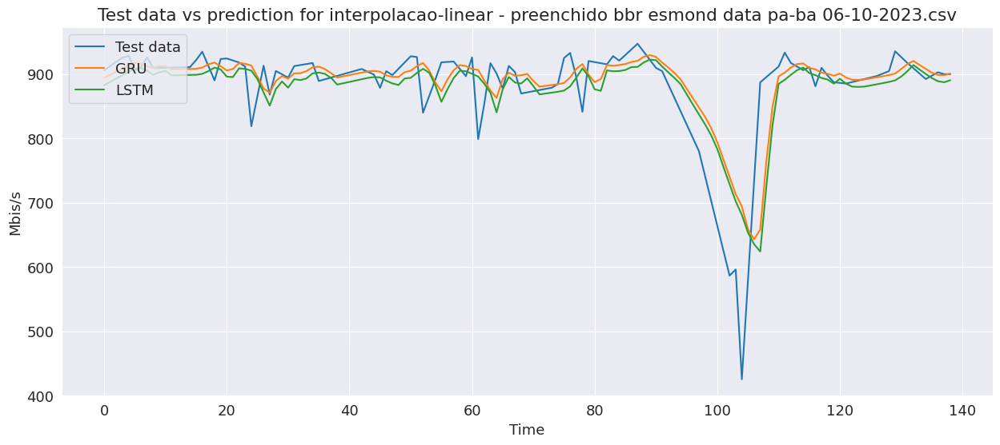

GRU:
Mean Absolute Error: 27.0162
Root Mean Square Error: 49.1657

LSTM:
Mean Absolute Error: 30.9231
Root Mean Square Error: 50.8951

###################### interpolacao-linear - preenchido bbr esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 5s 56ms/step - loss: 0.9533 - root_mean_squared_error: 0.9764 - val_loss: 0.8833 - val_root_mean_squared_error: 0.9398
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.9322 - root_mean_squared_error: 0.9655 - val_loss: 0.8635 - val_root_mean_squared_error: 0.9293
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.9114 - root_mean_squared_error: 0.9547 - val_loss: 0.8441 - val_root_mean_squared_error: 0.9187
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.8909 - root_mean_squared_error: 0.9439 - val_loss: 0.8250 - val_root_mean_squared_error: 0.9083
Epoch 5/150
14/14 [==============================] - 0s 7ms/

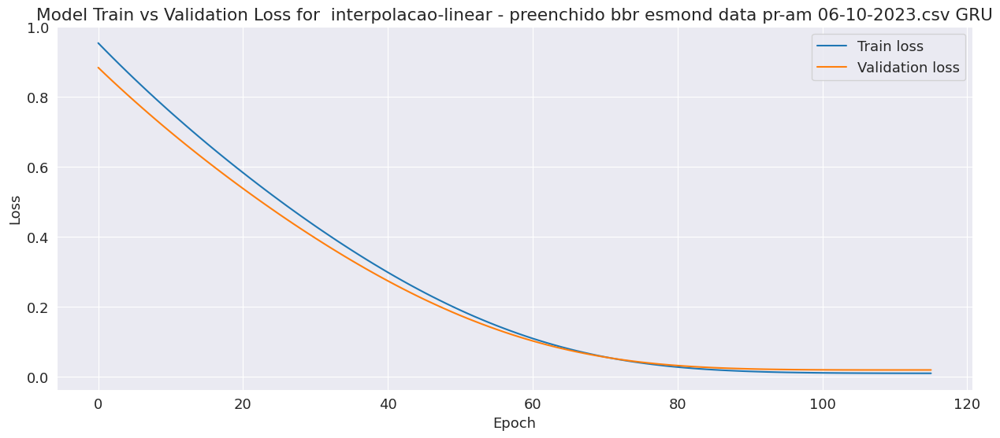

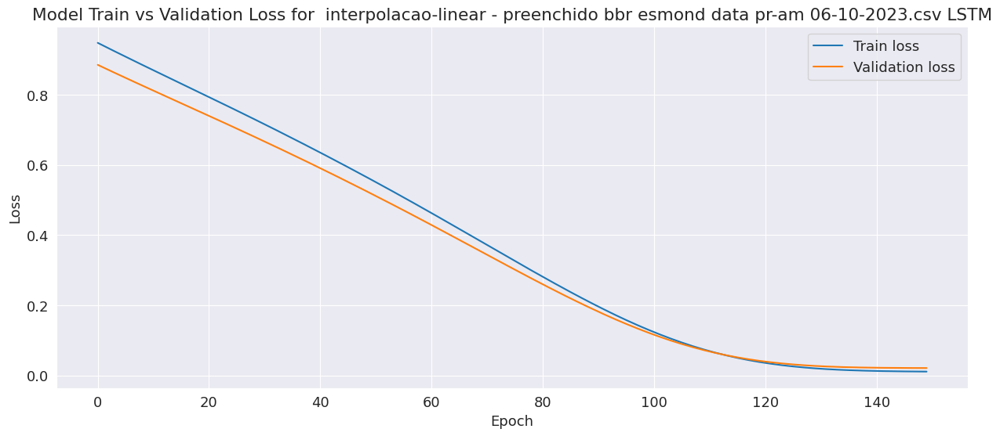

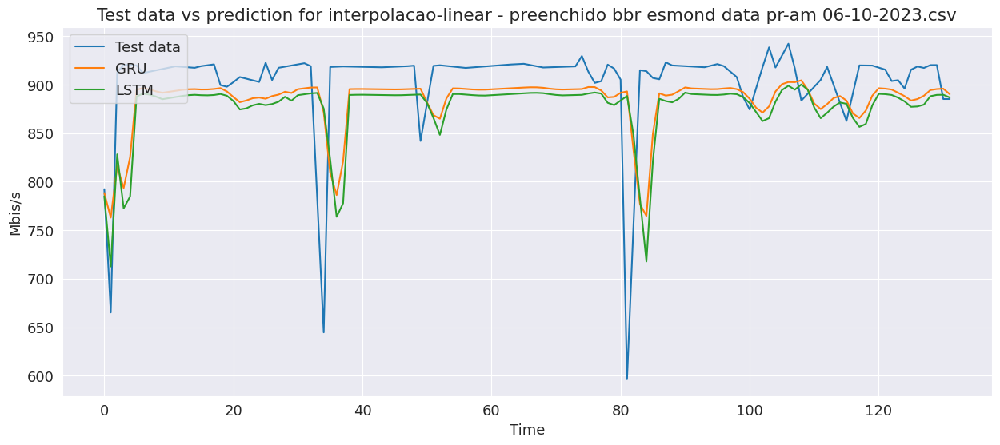

GRU:
Mean Absolute Error: 34.6468
Root Mean Square Error: 52.5064

LSTM:
Mean Absolute Error: 40.6556
Root Mean Square Error: 57.9171

###################### interpolacao-linear - preenchido cubic esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 5s 53ms/step - loss: 0.6175 - root_mean_squared_error: 0.7858 - val_loss: 0.6049 - val_root_mean_squared_error: 0.7778
Epoch 2/150
14/14 [==============================] - 0s 6ms/step - loss: 0.6003 - root_mean_squared_error: 0.7748 - val_loss: 0.5880 - val_root_mean_squared_error: 0.7668
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.5834 - root_mean_squared_error: 0.7638 - val_loss: 0.5713 - val_root_mean_squared_error: 0.7558
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.5670 - root_mean_squared_error: 0.7530 - val_loss: 0.5548 - val_root_mean_squared_error: 0.7448
Epoch 5/150
14/14 [==============================] - 0s 7m

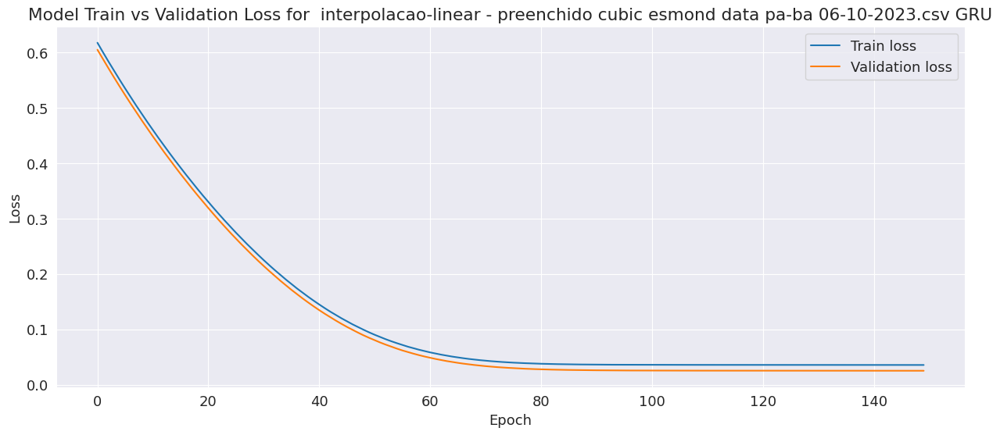

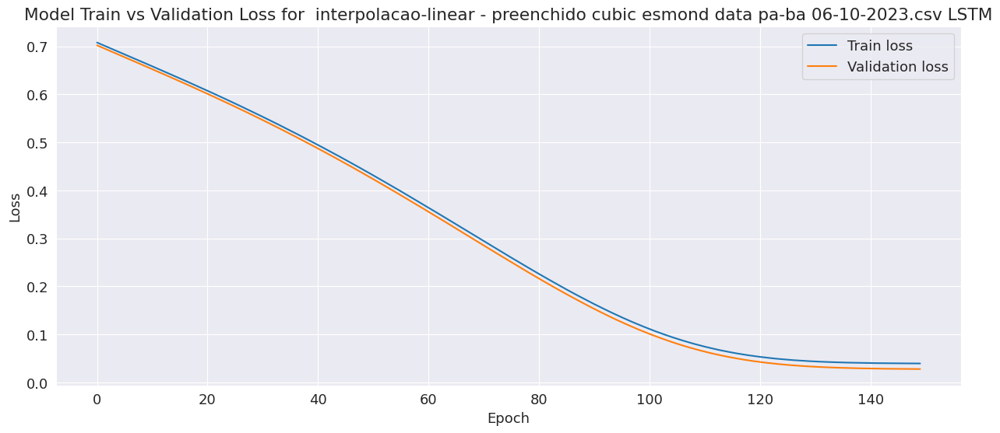

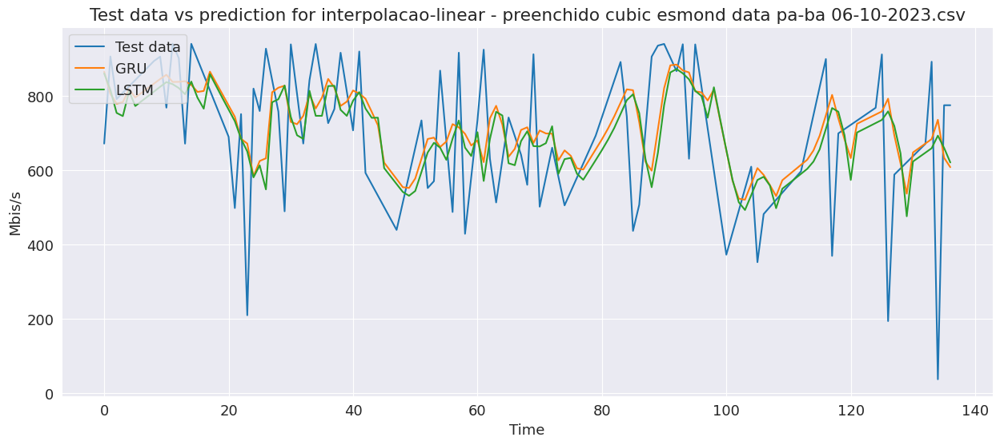

GRU:
Mean Absolute Error: 119.3414
Root Mean Square Error: 163.7536

LSTM:
Mean Absolute Error: 123.6070
Root Mean Square Error: 164.4494

###################### interpolacao-linear - preenchido cubic esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 5s 54ms/step - loss: 0.7865 - root_mean_squared_error: 0.8868 - val_loss: 0.7309 - val_root_mean_squared_error: 0.8549
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.7697 - root_mean_squared_error: 0.8773 - val_loss: 0.7151 - val_root_mean_squared_error: 0.8457
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.7532 - root_mean_squared_error: 0.8678 - val_loss: 0.6998 - val_root_mean_squared_error: 0.8365
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.7369 - root_mean_squared_error: 0.8584 - val_loss: 0.6845 - val_root_mean_squared_error: 0.8274
Epoch 5/150
14/14 [==============================] - 0

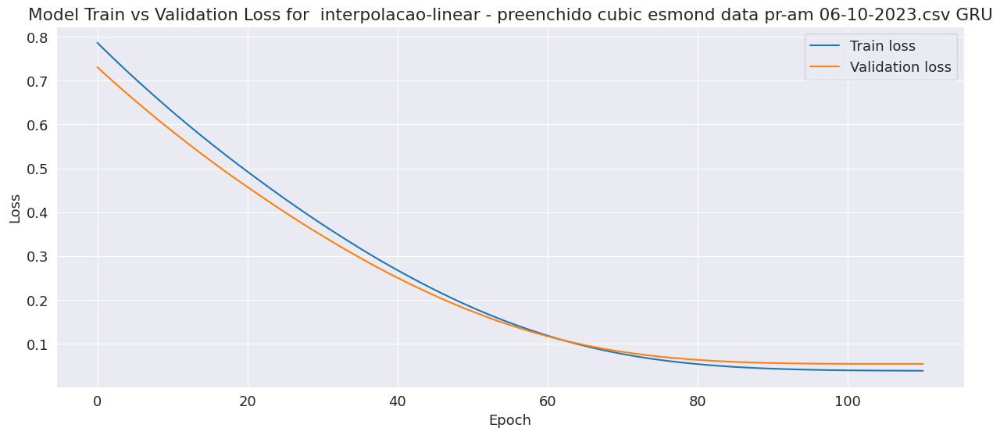

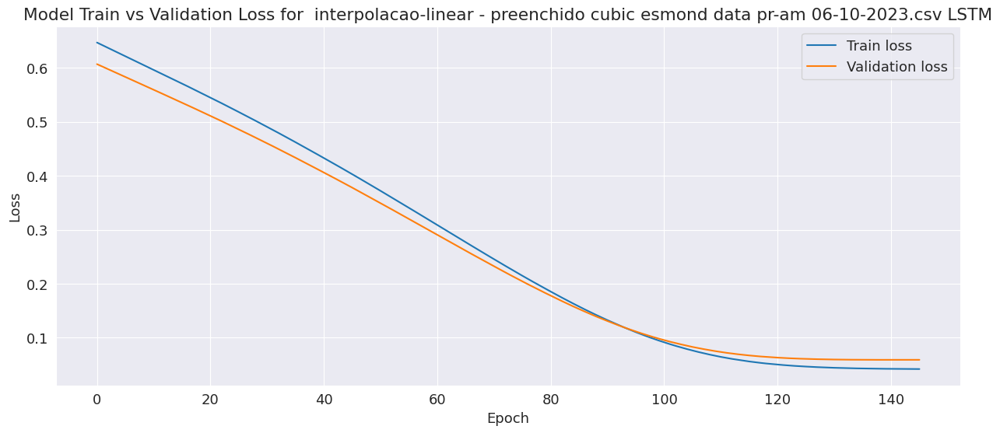

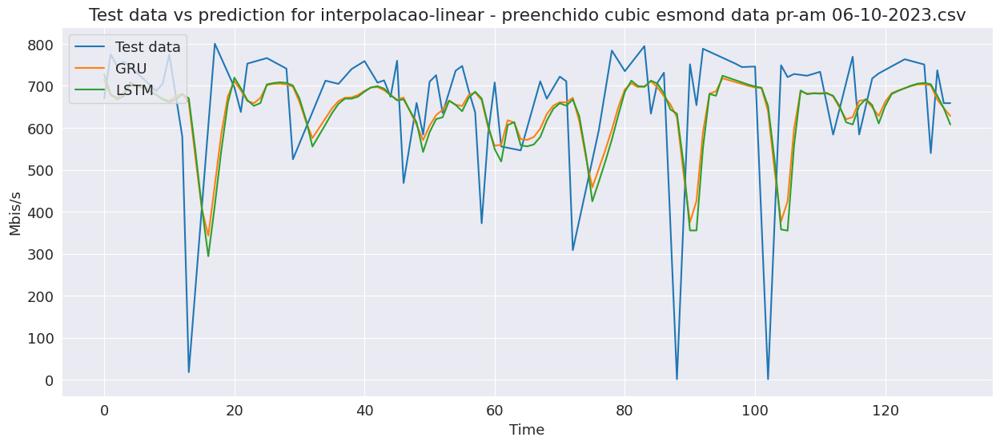

GRU:
Mean Absolute Error: 101.0552
Root Mean Square Error: 153.6680

LSTM:
Mean Absolute Error: 108.5529
Root Mean Square Error: 162.6974

###################### interpolacao-ponderada-no-tempo - preenchido bbr esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
15/15 [==============================] - 4s 56ms/step - loss: 0.6256 - root_mean_squared_error: 0.7909 - val_loss: 0.6171 - val_root_mean_squared_error: 0.7856
Epoch 2/150
15/15 [==============================] - 0s 6ms/step - loss: 0.6095 - root_mean_squared_error: 0.7807 - val_loss: 0.6010 - val_root_mean_squared_error: 0.7752
Epoch 3/150
15/15 [==============================] - 0s 7ms/step - loss: 0.5936 - root_mean_squared_error: 0.7704 - val_loss: 0.5851 - val_root_mean_squared_error: 0.7649
Epoch 4/150
15/15 [==============================] - 0s 7ms/step - loss: 0.5779 - root_mean_squared_error: 0.7602 - val_loss: 0.5694 - val_root_mean_squared_error: 0.7546
Epoch 5/150
15/15 [=========================

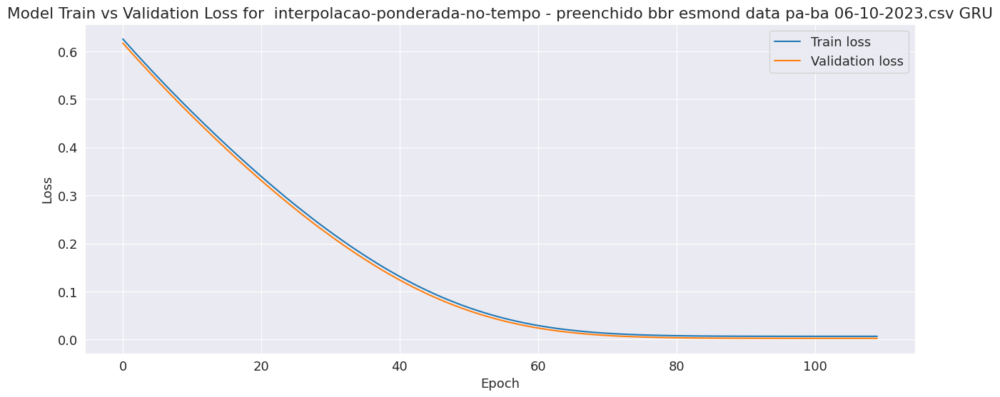

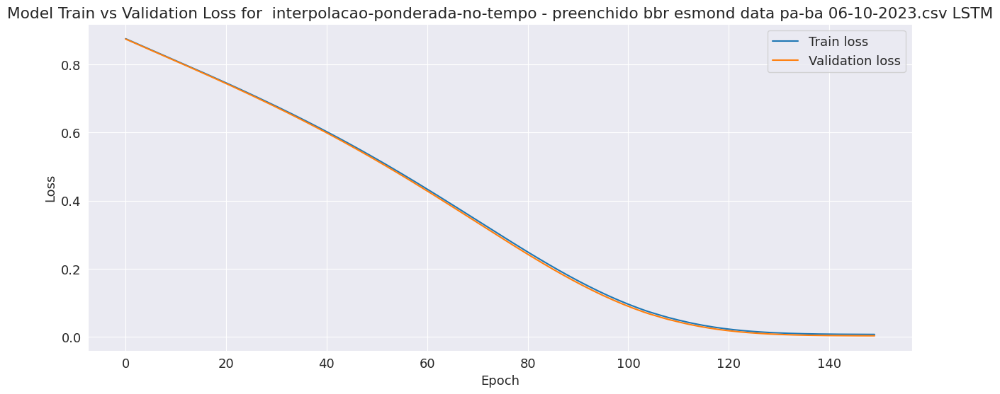

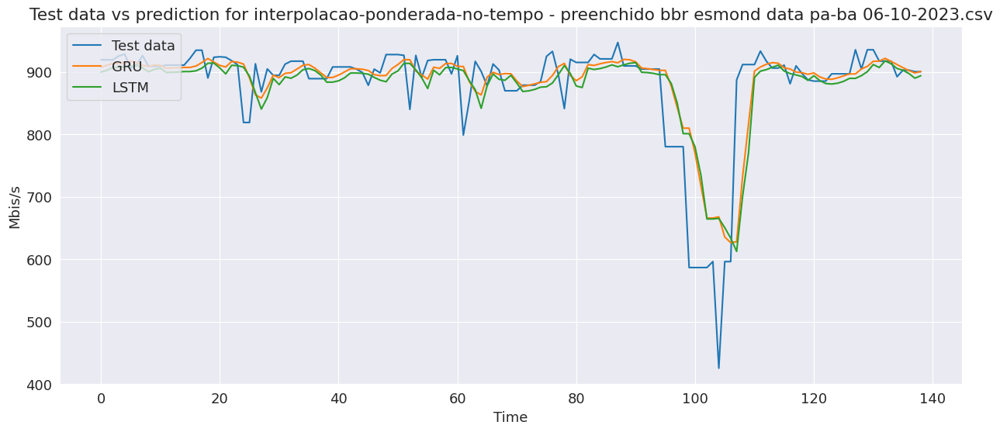

GRU:
Mean Absolute Error: 27.0115
Root Mean Square Error: 52.3878

LSTM:
Mean Absolute Error: 31.1420
Root Mean Square Error: 55.7830

###################### interpolacao-ponderada-no-tempo - preenchido bbr esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 5s 68ms/step - loss: 1.1487 - root_mean_squared_error: 1.0718 - val_loss: 1.0318 - val_root_mean_squared_error: 1.0158
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 1.1256 - root_mean_squared_error: 1.0610 - val_loss: 1.0108 - val_root_mean_squared_error: 1.0054
Epoch 3/150
14/14 [==============================] - 0s 8ms/step - loss: 1.1030 - root_mean_squared_error: 1.0502 - val_loss: 0.9903 - val_root_mean_squared_error: 0.9951
Epoch 4/150
14/14 [==============================] - 0s 8ms/step - loss: 1.0806 - root_mean_squared_error: 1.0395 - val_loss: 0.9701 - val_root_mean_squared_error: 0.9849
Epoch 5/150
14/14 [=============================

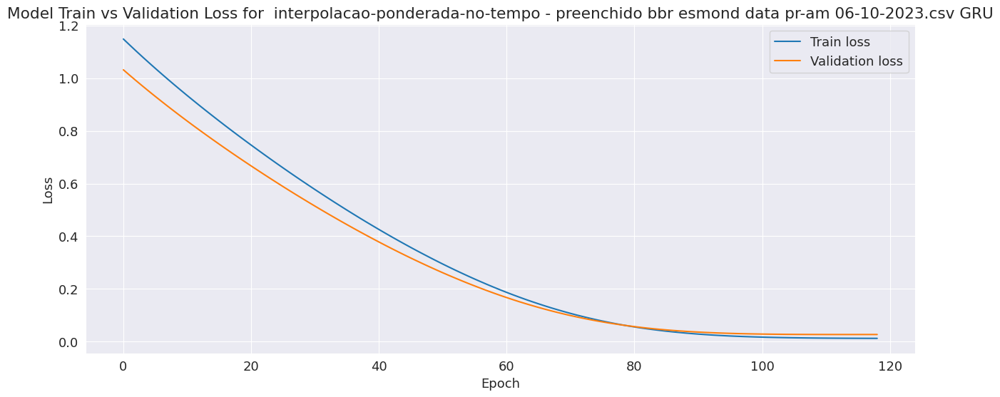

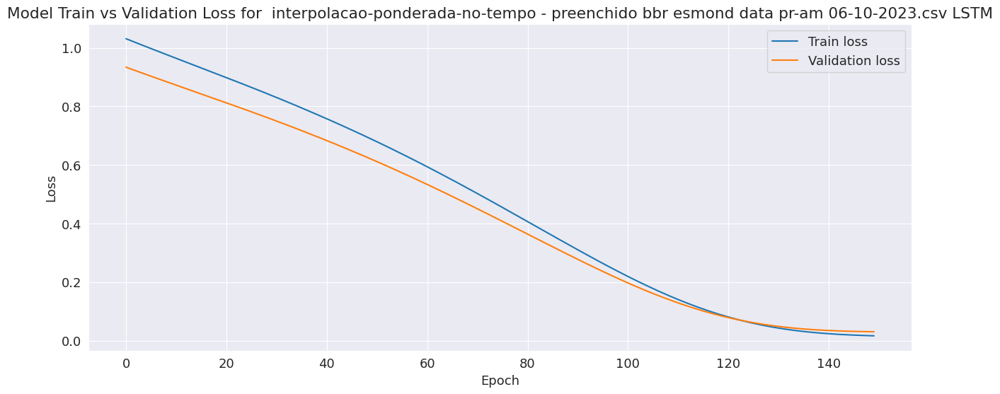

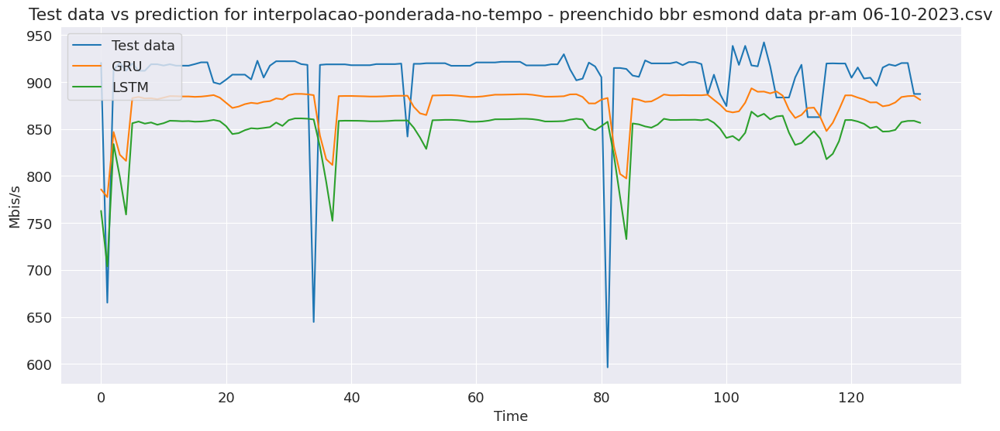

GRU:
Mean Absolute Error: 41.7125
Root Mean Square Error: 55.0695

LSTM:
Mean Absolute Error: 66.3576
Root Mean Square Error: 74.3196

###################### interpolacao-ponderada-no-tempo - preenchido cubic esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 66ms/step - loss: 0.9080 - root_mean_squared_error: 0.9529 - val_loss: 0.9259 - val_root_mean_squared_error: 0.9622
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.8890 - root_mean_squared_error: 0.9429 - val_loss: 0.9065 - val_root_mean_squared_error: 0.9521
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.8703 - root_mean_squared_error: 0.9329 - val_loss: 0.8873 - val_root_mean_squared_error: 0.9420
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.8521 - root_mean_squared_error: 0.9231 - val_loss: 0.8684 - val_root_mean_squared_error: 0.9319
Epoch 5/150
14/14 [===========================

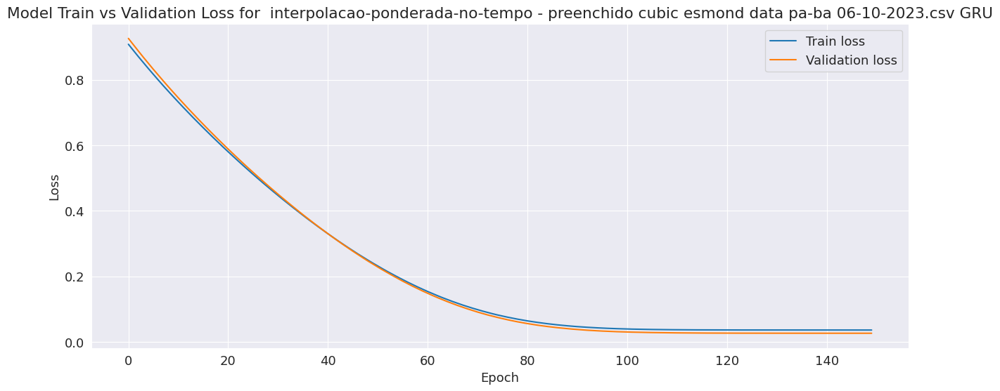

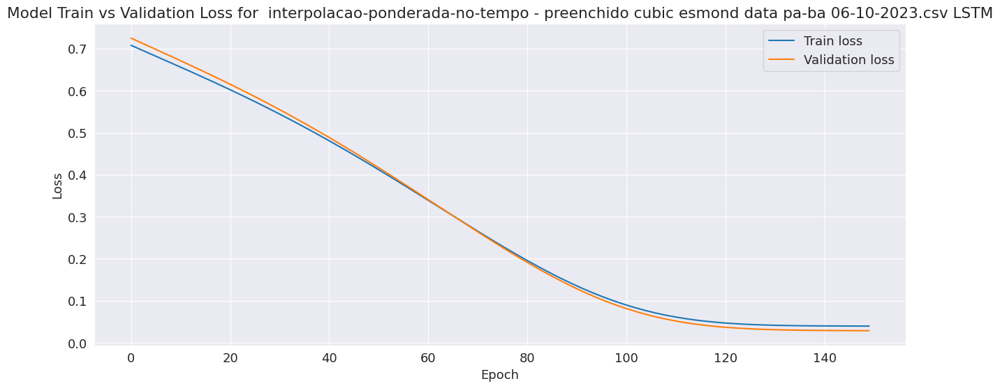

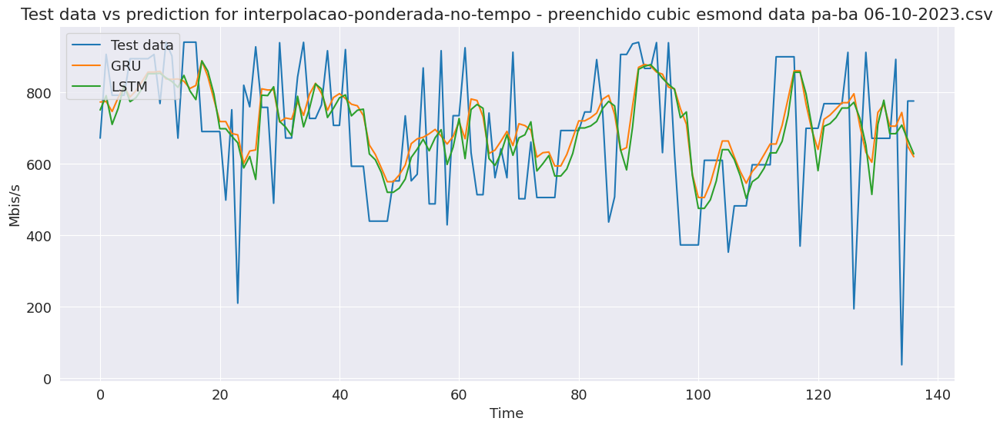

GRU:
Mean Absolute Error: 133.8443
Root Mean Square Error: 175.8931

LSTM:
Mean Absolute Error: 135.4012
Root Mean Square Error: 176.8616

###################### interpolacao-ponderada-no-tempo - preenchido cubic esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 5s 52ms/step - loss: 0.6929 - root_mean_squared_error: 0.8324 - val_loss: 0.7014 - val_root_mean_squared_error: 0.8375
Epoch 2/150
14/14 [==============================] - 0s 9ms/step - loss: 0.6786 - root_mean_squared_error: 0.8238 - val_loss: 0.6870 - val_root_mean_squared_error: 0.8288
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.6645 - root_mean_squared_error: 0.8152 - val_loss: 0.6727 - val_root_mean_squared_error: 0.8202
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.6506 - root_mean_squared_error: 0.8066 - val_loss: 0.6587 - val_root_mean_squared_error: 0.8116
Epoch 5/150
14/14 [=======================

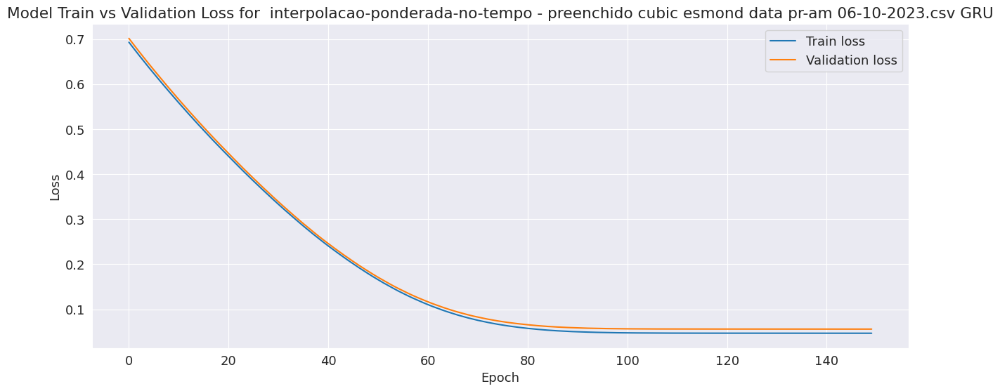

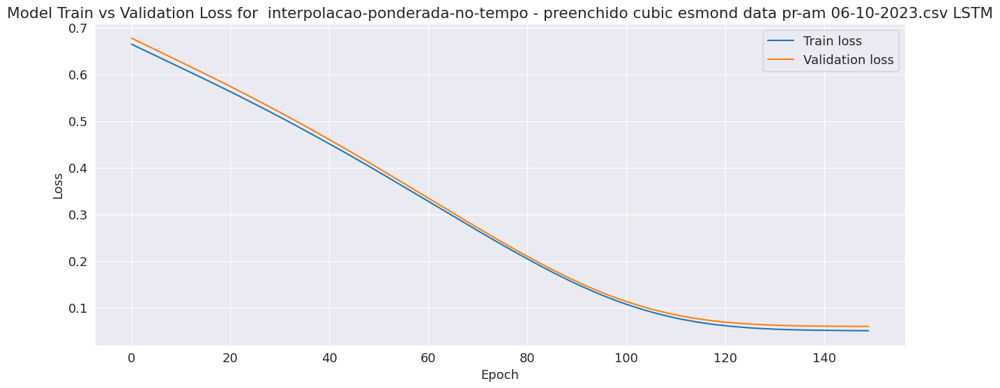

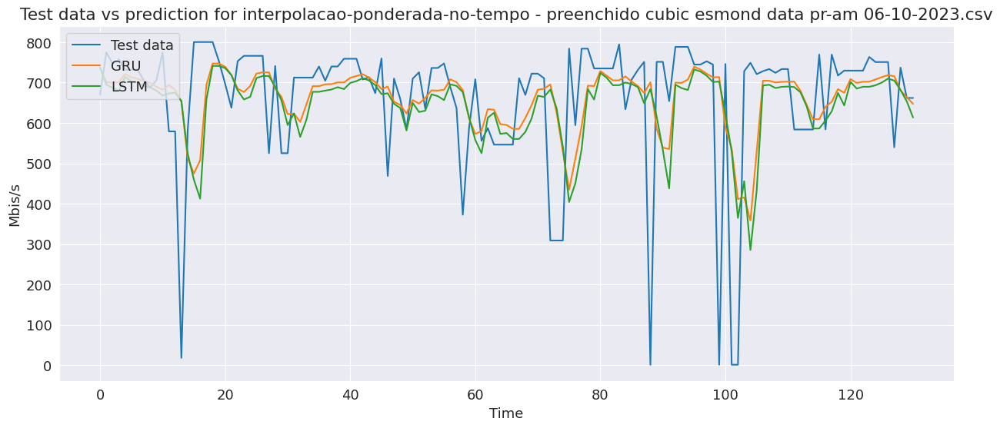

GRU:
Mean Absolute Error: 100.9263
Root Mean Square Error: 164.4138

LSTM:
Mean Absolute Error: 108.9892
Root Mean Square Error: 170.3673

###################### knn - preenchido bbr esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
15/15 [==============================] - 5s 96ms/step - loss: 0.7018 - root_mean_squared_error: 0.8377 - val_loss: 0.6859 - val_root_mean_squared_error: 0.8282
Epoch 2/150
15/15 [==============================] - 0s 7ms/step - loss: 0.6826 - root_mean_squared_error: 0.8262 - val_loss: 0.6669 - val_root_mean_squared_error: 0.8166
Epoch 3/150
15/15 [==============================] - 0s 7ms/step - loss: 0.6638 - root_mean_squared_error: 0.8147 - val_loss: 0.6483 - val_root_mean_squared_error: 0.8051
Epoch 4/150
15/15 [==============================] - 0s 7ms/step - loss: 0.6452 - root_mean_squared_error: 0.8033 - val_loss: 0.6298 - val_root_mean_squared_error: 0.7936
Epoch 5/150
15/15 [==============================] - 0s 7ms/step - loss:

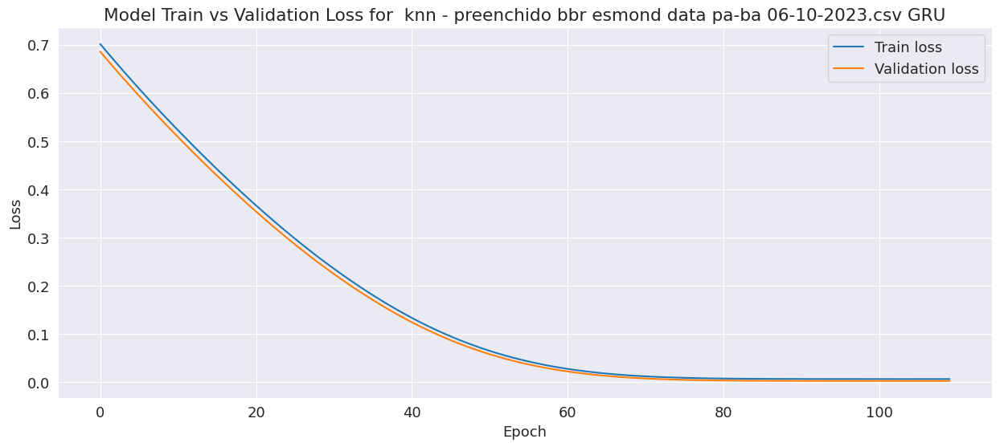

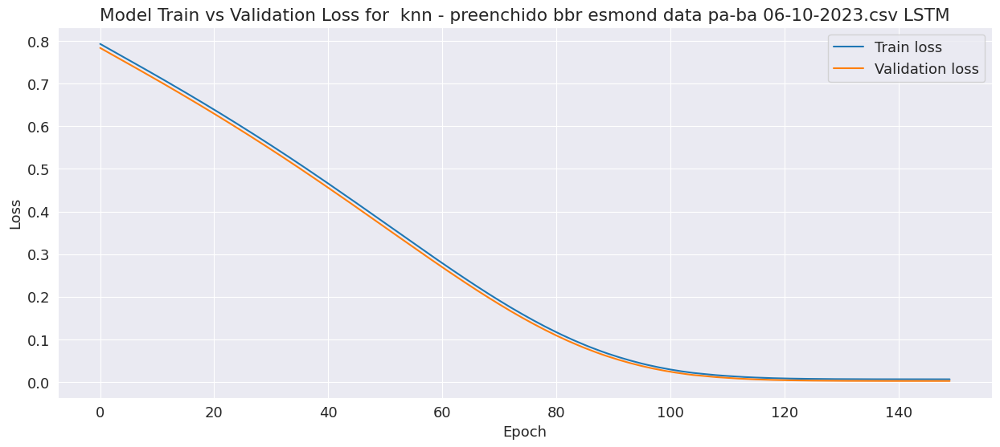

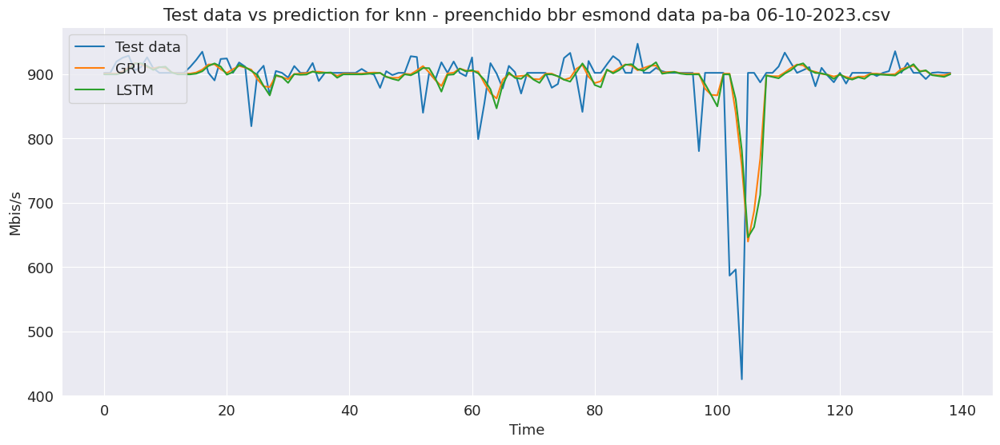

GRU:
Mean Absolute Error: 24.4444
Root Mean Square Error: 58.2721

LSTM:
Mean Absolute Error: 25.8386
Root Mean Square Error: 61.5640

###################### knn - preenchido bbr esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 60ms/step - loss: 0.8969 - root_mean_squared_error: 0.9471 - val_loss: 0.8413 - val_root_mean_squared_error: 0.9172
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.8761 - root_mean_squared_error: 0.9360 - val_loss: 0.8216 - val_root_mean_squared_error: 0.9064
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.8556 - root_mean_squared_error: 0.9250 - val_loss: 0.8024 - val_root_mean_squared_error: 0.8958
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.8355 - root_mean_squared_error: 0.9141 - val_loss: 0.7835 - val_root_mean_squared_error: 0.8851
Epoch 5/150
14/14 [==============================] - 0s 7ms/step - loss: 0.8

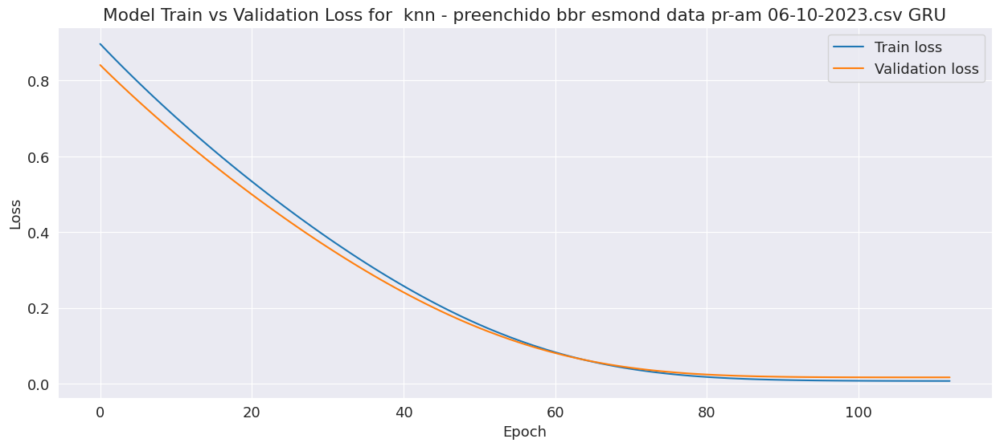

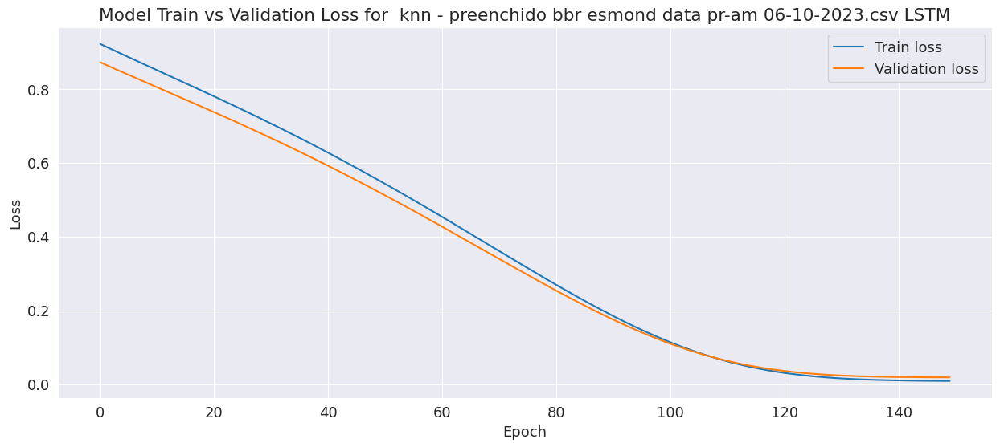

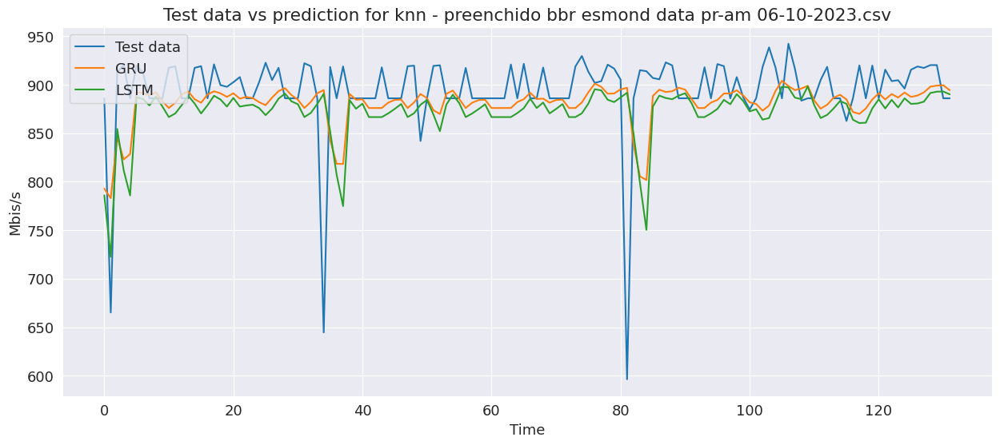

GRU:
Mean Absolute Error: 27.7294
Root Mean Square Error: 48.3310

LSTM:
Mean Absolute Error: 33.4771
Root Mean Square Error: 52.7116

###################### knn - preenchido cubic esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 7s 91ms/step - loss: 0.5534 - root_mean_squared_error: 0.7439 - val_loss: 0.5393 - val_root_mean_squared_error: 0.7344
Epoch 2/150
14/14 [==============================] - 0s 9ms/step - loss: 0.5390 - root_mean_squared_error: 0.7342 - val_loss: 0.5251 - val_root_mean_squared_error: 0.7246
Epoch 3/150
14/14 [==============================] - 0s 10ms/step - loss: 0.5248 - root_mean_squared_error: 0.7244 - val_loss: 0.5110 - val_root_mean_squared_error: 0.7148
Epoch 4/150
14/14 [==============================] - 0s 10ms/step - loss: 0.5109 - root_mean_squared_error: 0.7148 - val_loss: 0.4970 - val_root_mean_squared_error: 0.7050
Epoch 5/150
14/14 [==============================] - 0s 10ms/step - loss

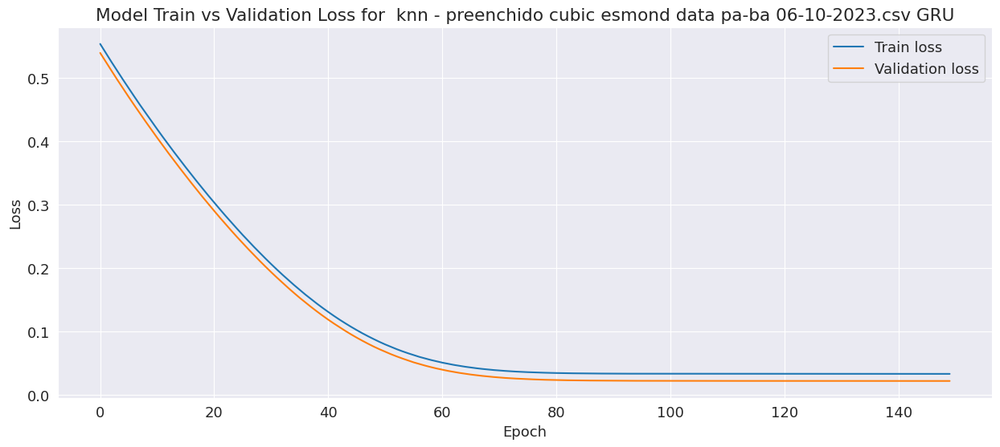

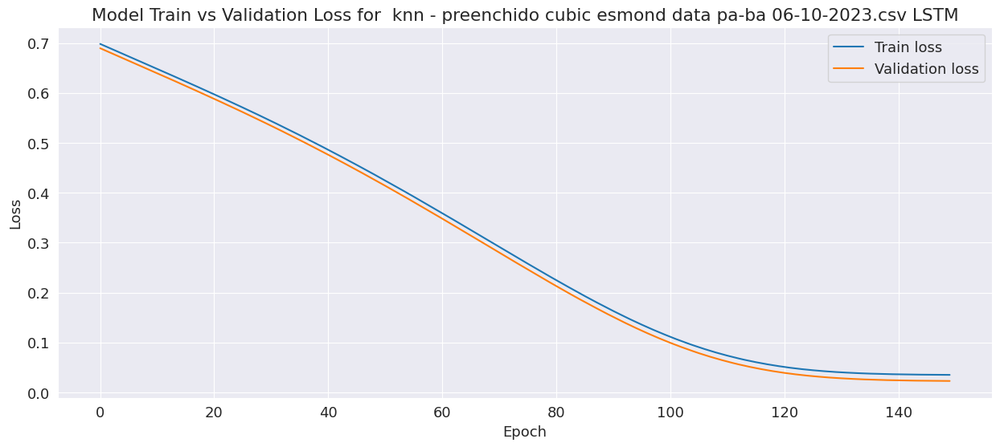

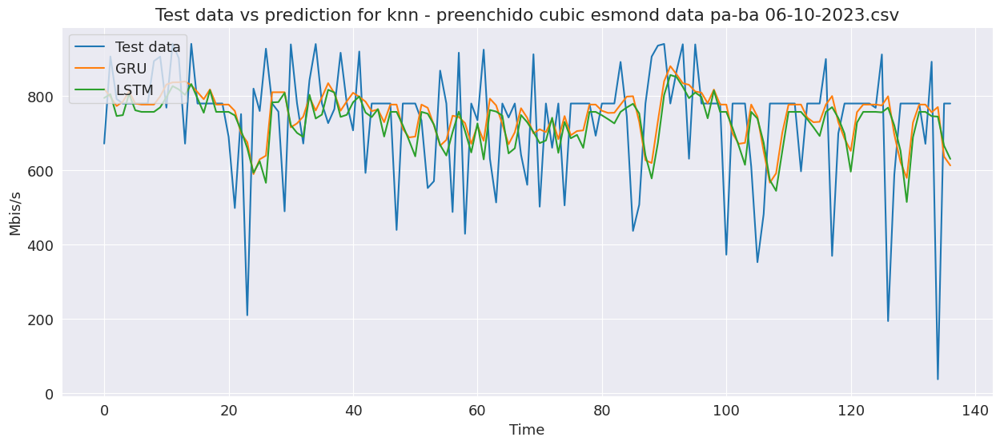

GRU:
Mean Absolute Error: 122.7517
Root Mean Square Error: 170.9939

LSTM:
Mean Absolute Error: 127.7292
Root Mean Square Error: 171.4423

###################### knn - preenchido cubic esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 55ms/step - loss: 0.5210 - root_mean_squared_error: 0.7218 - val_loss: 0.4930 - val_root_mean_squared_error: 0.7021
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.5087 - root_mean_squared_error: 0.7132 - val_loss: 0.4813 - val_root_mean_squared_error: 0.6937
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.4965 - root_mean_squared_error: 0.7046 - val_loss: 0.4698 - val_root_mean_squared_error: 0.6854
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.4845 - root_mean_squared_error: 0.6960 - val_loss: 0.4585 - val_root_mean_squared_error: 0.6771
Epoch 5/150
14/14 [==============================] - 0s 7ms/step - los

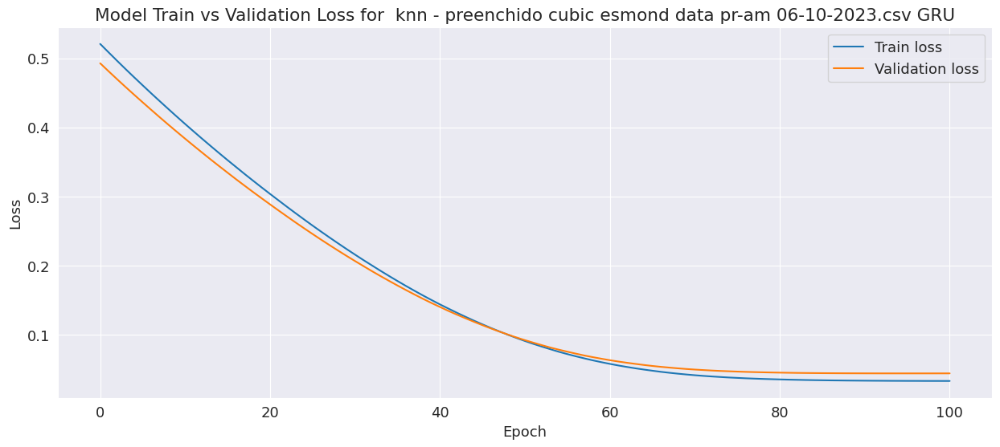

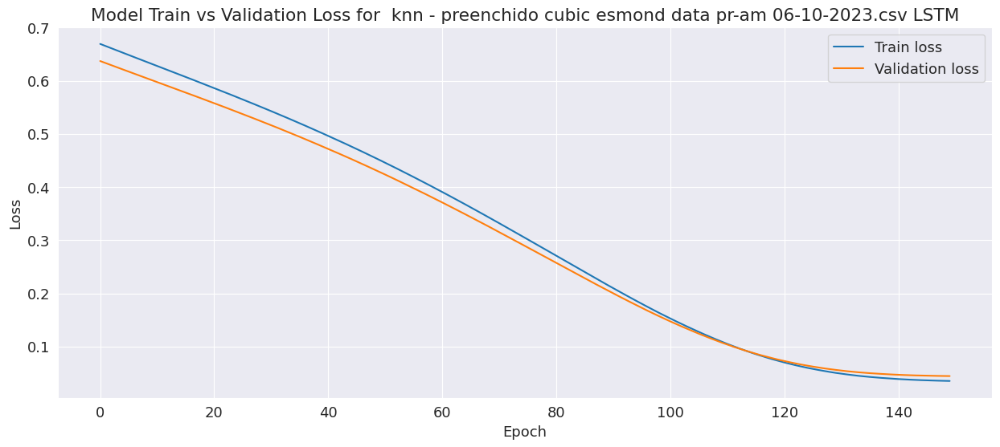

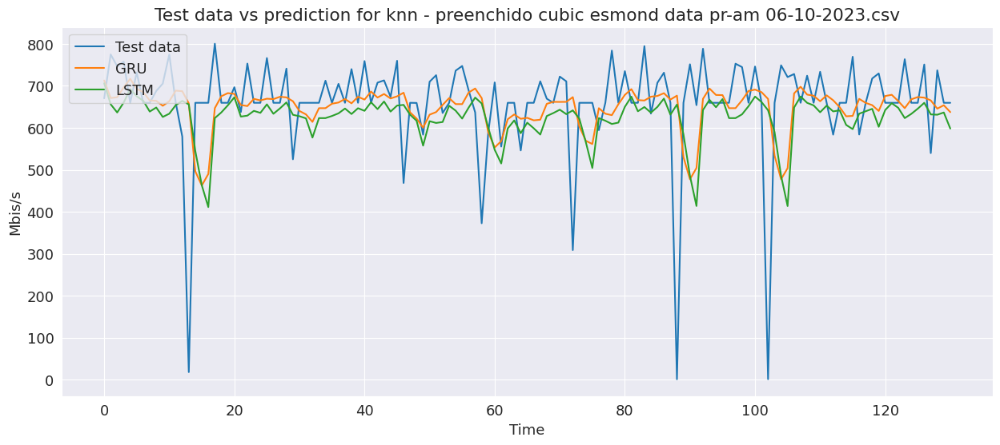

GRU:
Mean Absolute Error: 78.1533
Root Mean Square Error: 134.9256

LSTM:
Mean Absolute Error: 86.8074
Root Mean Square Error: 139.1581

###################### media-dia-repetido - preenchido bbr esmond data pa-ba 06-10-2023_media_original.csv ##########################
Epoch 1/150
14/14 [==============================] - 5s 57ms/step - loss: 0.7621 - root_mean_squared_error: 0.8730 - val_loss: 0.6995 - val_root_mean_squared_error: 0.8363
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.7422 - root_mean_squared_error: 0.8615 - val_loss: 0.6812 - val_root_mean_squared_error: 0.8254
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.7226 - root_mean_squared_error: 0.8500 - val_loss: 0.6633 - val_root_mean_squared_error: 0.8144
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.7032 - root_mean_squared_error: 0.8386 - val_loss: 0.6456 - val_root_mean_squared_error: 0.8035
Epoch 5/150
14/14 [=========================

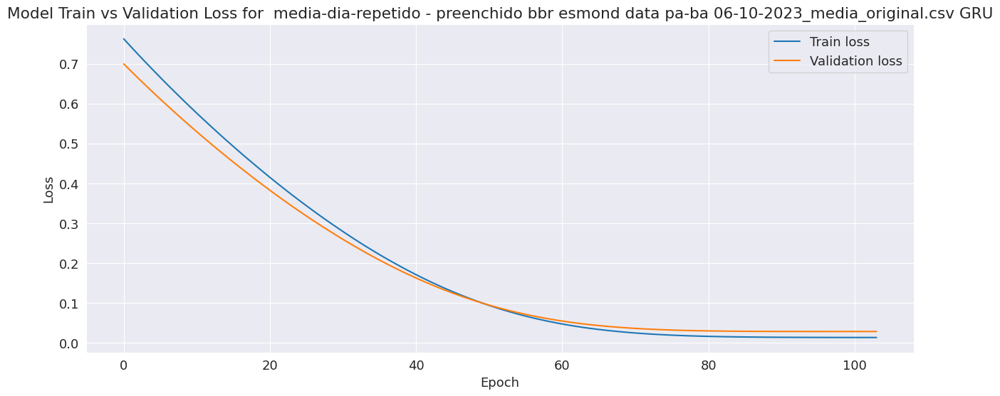

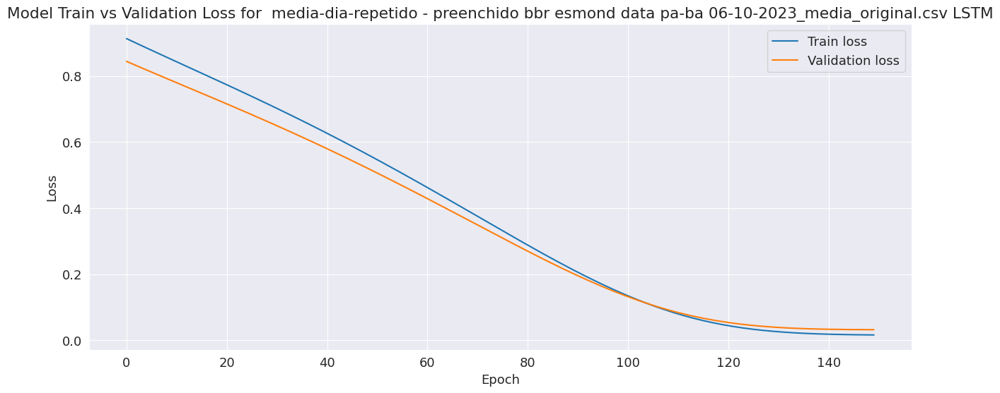

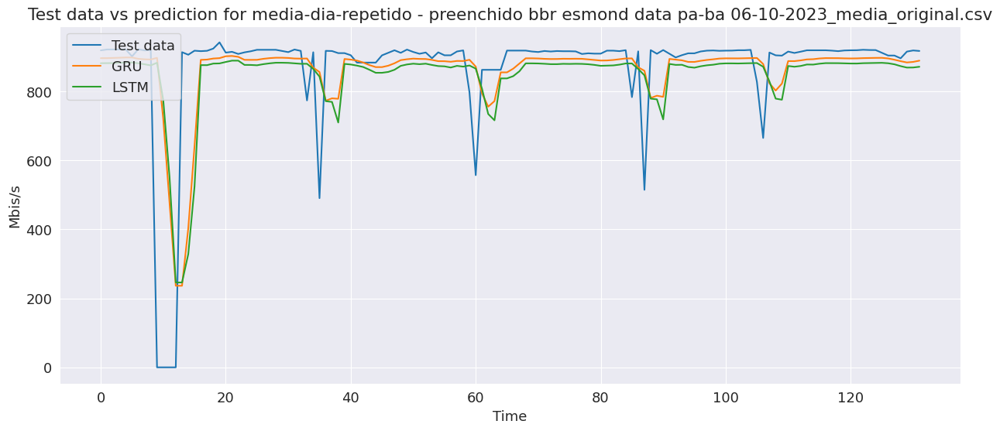

GRU:
Mean Absolute Error: 69.5098
Root Mean Square Error: 152.2204

LSTM:
Mean Absolute Error: 85.0060
Root Mean Square Error: 162.4321

###################### media-dia-repetido - preenchido bbr esmond data pr-am 06-10-2023_media_original.csv ##########################
Epoch 1/150
15/15 [==============================] - 4s 57ms/step - loss: 0.8889 - root_mean_squared_error: 0.9428 - val_loss: 0.8998 - val_root_mean_squared_error: 0.9486
Epoch 2/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8689 - root_mean_squared_error: 0.9322 - val_loss: 0.8795 - val_root_mean_squared_error: 0.9378
Epoch 3/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8493 - root_mean_squared_error: 0.9215 - val_loss: 0.8594 - val_root_mean_squared_error: 0.9271
Epoch 4/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8299 - root_mean_squared_error: 0.9110 - val_loss: 0.8396 - val_root_mean_squared_error: 0.9163
Epoch 5/150
15/15 [=========================

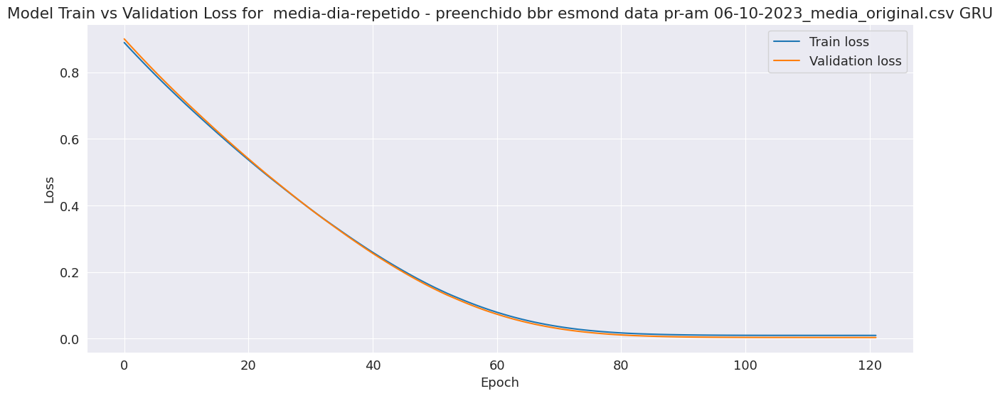

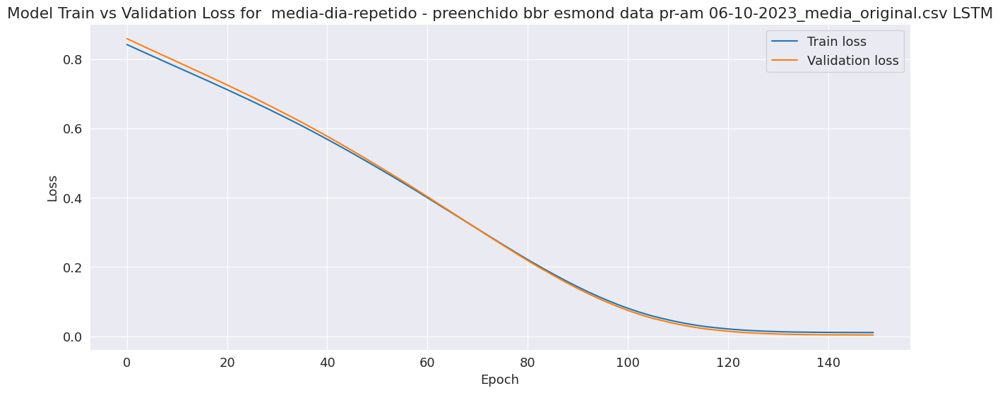

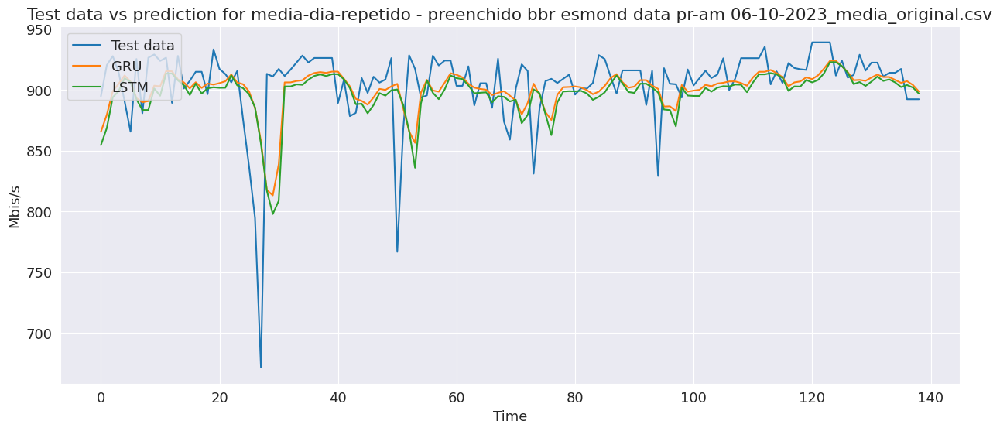

GRU:
Mean Absolute Error: 20.9784
Root Mean Square Error: 32.6788

LSTM:
Mean Absolute Error: 23.3182
Root Mean Square Error: 34.8811

###################### media-dia-repetido - preenchido cubic esmond data pa-ba 06-10-2023_media_original.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 58ms/step - loss: 0.5484 - root_mean_squared_error: 0.7405 - val_loss: 0.5476 - val_root_mean_squared_error: 0.7400
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.5356 - root_mean_squared_error: 0.7319 - val_loss: 0.5351 - val_root_mean_squared_error: 0.7315
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.5232 - root_mean_squared_error: 0.7233 - val_loss: 0.5227 - val_root_mean_squared_error: 0.7230
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.5108 - root_mean_squared_error: 0.7147 - val_loss: 0.5105 - val_root_mean_squared_error: 0.7145
Epoch 5/150
14/14 [=========================

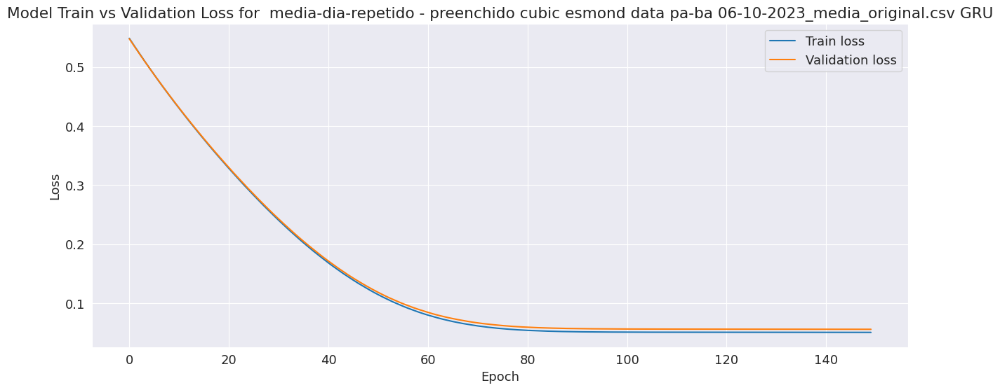

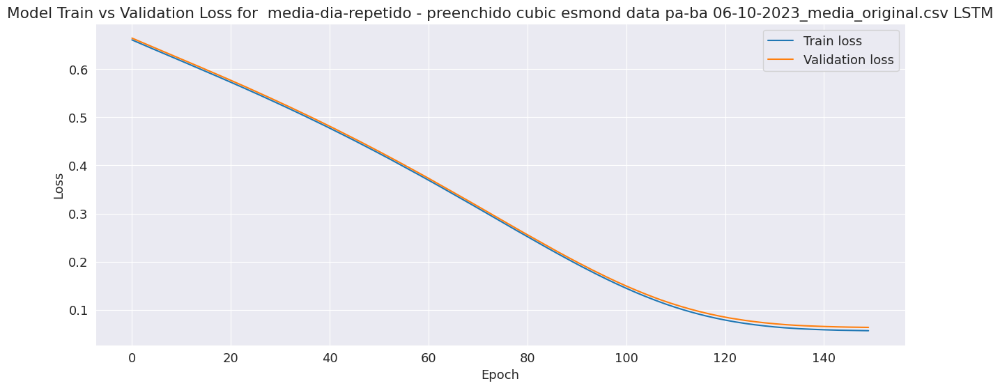

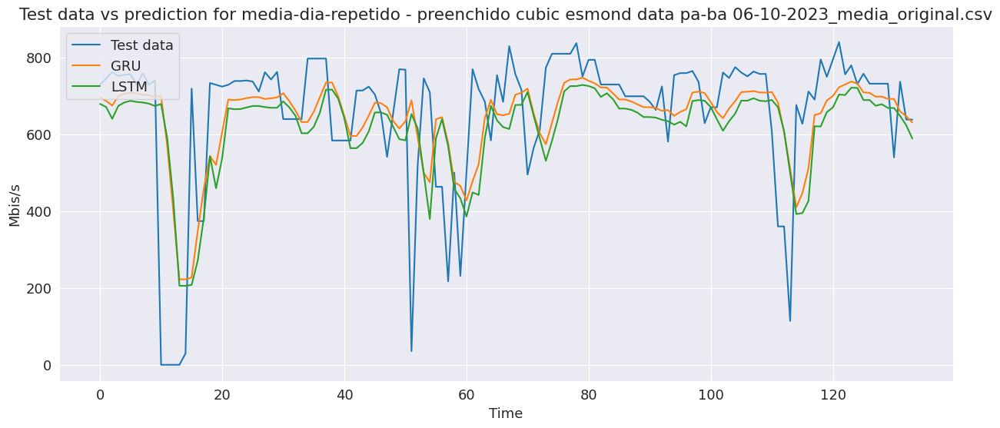

GRU:
Mean Absolute Error: 106.4778
Root Mean Square Error: 160.6976

LSTM:
Mean Absolute Error: 124.5172
Root Mean Square Error: 172.0172

###################### media-dia-repetido - preenchido cubic esmond data pr-am 06-10-2023_media_original.csv ##########################
Epoch 1/150
14/14 [==============================] - 5s 58ms/step - loss: 0.6010 - root_mean_squared_error: 0.7753 - val_loss: 0.6078 - val_root_mean_squared_error: 0.7796
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.5866 - root_mean_squared_error: 0.7659 - val_loss: 0.5926 - val_root_mean_squared_error: 0.7698
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.5723 - root_mean_squared_error: 0.7565 - val_loss: 0.5778 - val_root_mean_squared_error: 0.7601
Epoch 4/150
14/14 [==============================] - 0s 8ms/step - loss: 0.5583 - root_mean_squared_error: 0.7472 - val_loss: 0.5631 - val_root_mean_squared_error: 0.7504
Epoch 5/150
14/14 [=====================

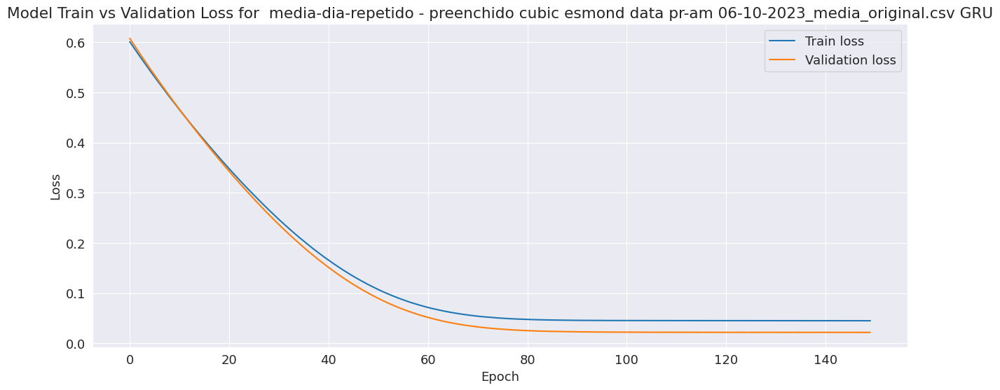

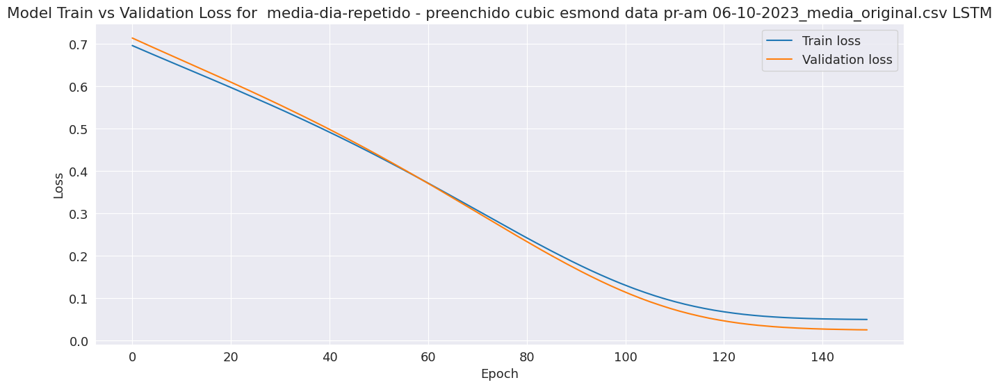

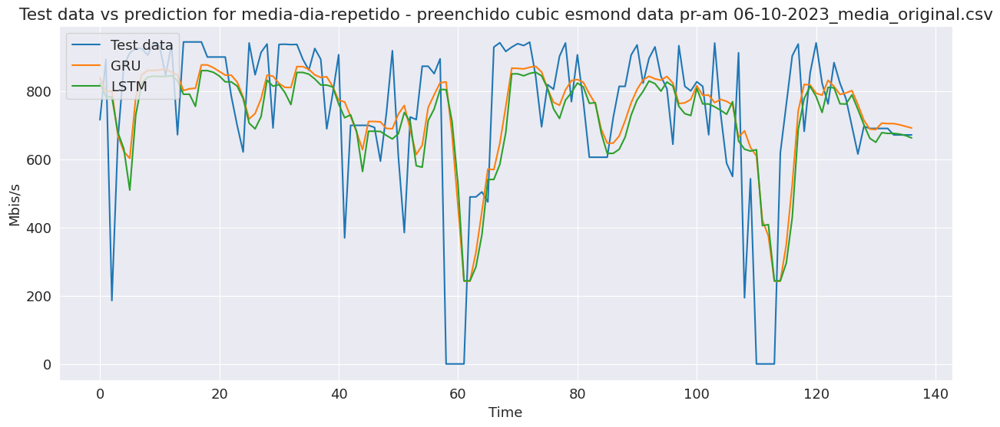

GRU:
Mean Absolute Error: 135.2951
Root Mean Square Error: 195.9350

LSTM:
Mean Absolute Error: 145.9517
Root Mean Square Error: 206.4546

###################### media-dia-repetido - vazao_ce_sp_bbr_original.csv ##########################
Epoch 1/150
15/15 [==============================] - 5s 50ms/step - loss: 0.9733 - root_mean_squared_error: 0.9866 - val_loss: 0.9702 - val_root_mean_squared_error: 0.9850
Epoch 2/150
15/15 [==============================] - 0s 7ms/step - loss: 0.9531 - root_mean_squared_error: 0.9762 - val_loss: 0.9499 - val_root_mean_squared_error: 0.9746
Epoch 3/150
15/15 [==============================] - 0s 7ms/step - loss: 0.9332 - root_mean_squared_error: 0.9660 - val_loss: 0.9299 - val_root_mean_squared_error: 0.9643
Epoch 4/150
15/15 [==============================] - 0s 7ms/step - loss: 0.9135 - root_mean_squared_error: 0.9558 - val_loss: 0.9103 - val_root_mean_squared_error: 0.9541
Epoch 5/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8

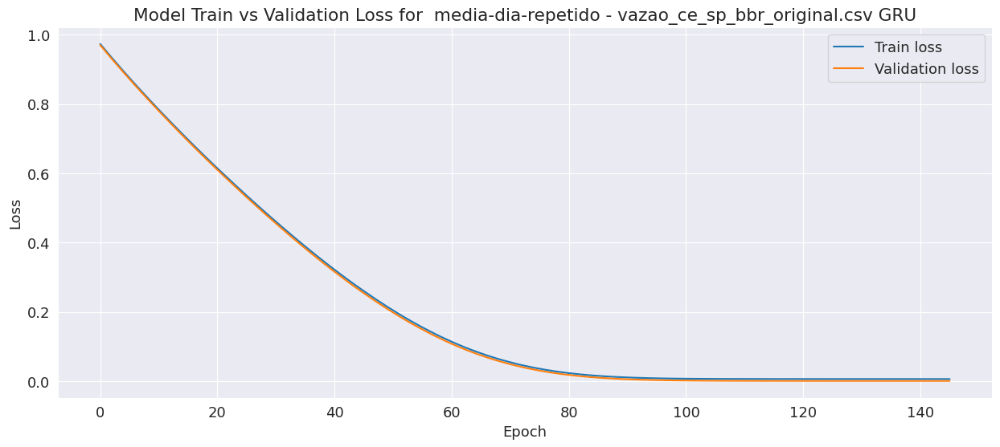

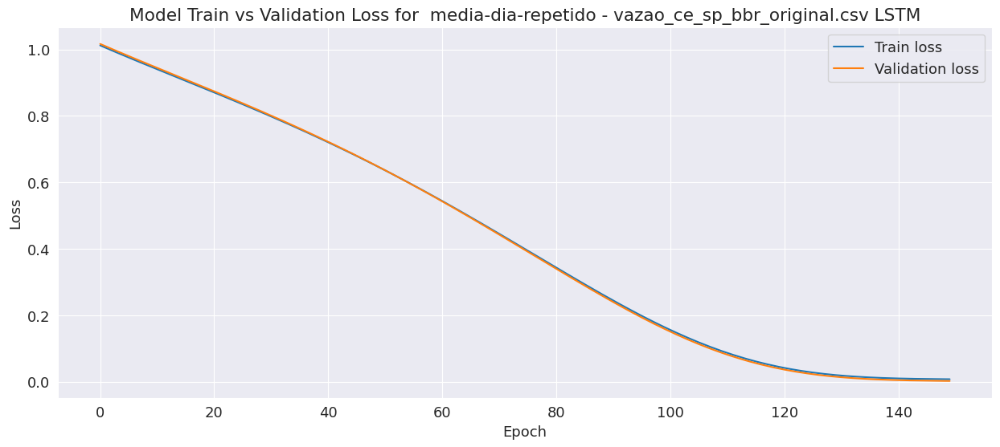

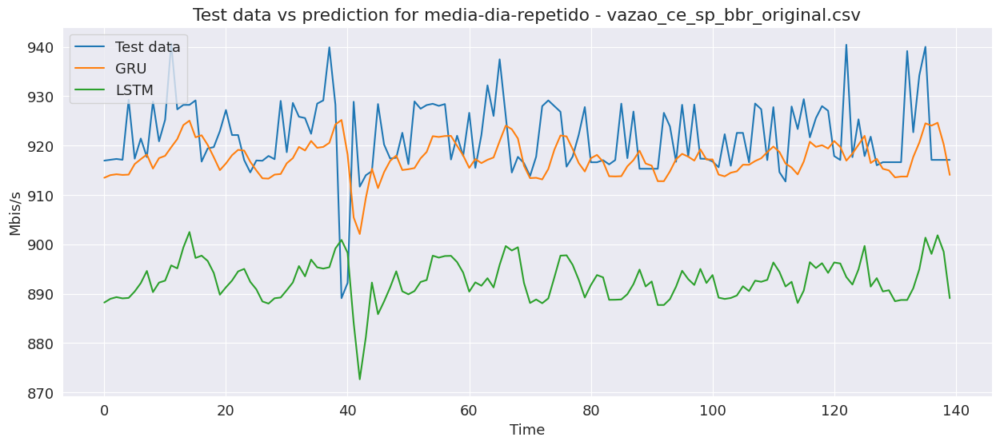

GRU:
Mean Absolute Error: 6.5690
Root Mean Square Error: 8.9988

LSTM:
Mean Absolute Error: 29.3783
Root Mean Square Error: 30.2527

###################### media-dia-repetido - vazao_mg_rs_bbr_original.csv ##########################
Epoch 1/150
13/13 [==============================] - 4s 56ms/step - loss: 0.2720 - root_mean_squared_error: 0.5216 - val_loss: 0.2706 - val_root_mean_squared_error: 0.5202
Epoch 2/150
13/13 [==============================] - 0s 8ms/step - loss: 0.2659 - root_mean_squared_error: 0.5156 - val_loss: 0.2644 - val_root_mean_squared_error: 0.5142
Epoch 3/150
13/13 [==============================] - 0s 7ms/step - loss: 0.2599 - root_mean_squared_error: 0.5098 - val_loss: 0.2583 - val_root_mean_squared_error: 0.5082
Epoch 4/150
13/13 [==============================] - 0s 7ms/step - loss: 0.2539 - root_mean_squared_error: 0.5039 - val_loss: 0.2523 - val_root_mean_squared_error: 0.5023
Epoch 5/150
13/13 [==============================] - 0s 7ms/step - loss: 0.2481 - 

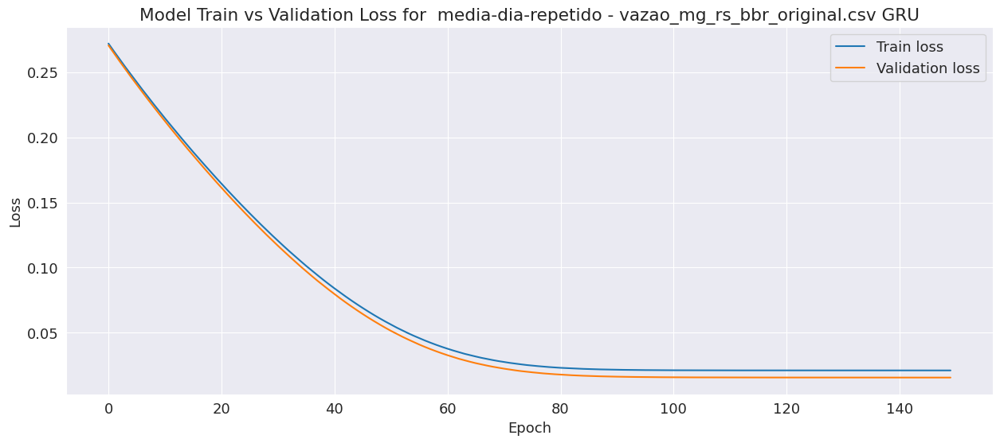

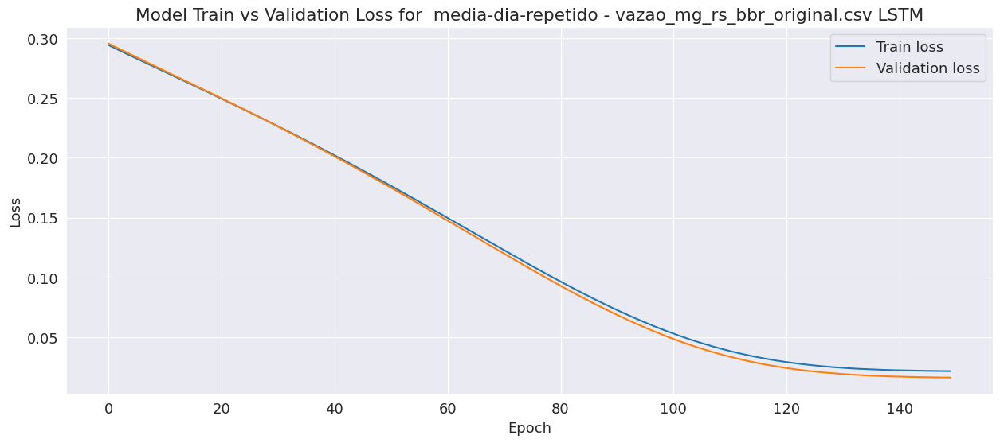

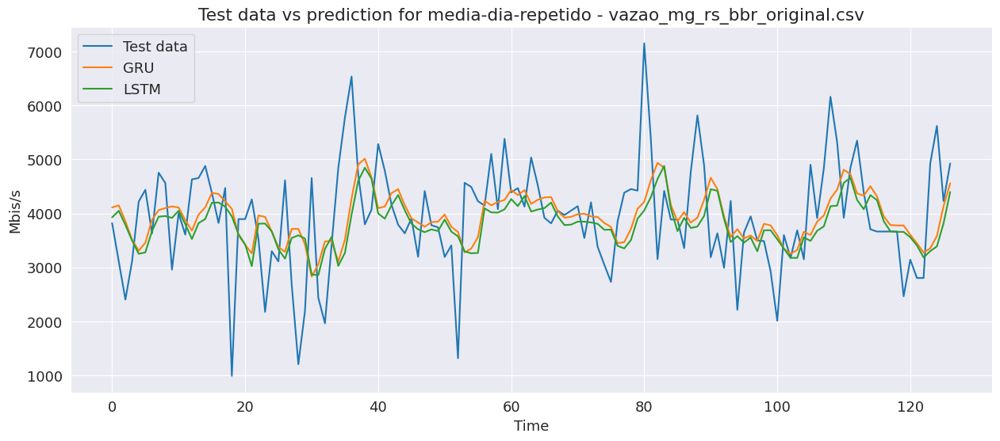

GRU:
Mean Absolute Error: 749.8649
Root Mean Square Error: 986.6807

LSTM:
Mean Absolute Error: 770.5286
Root Mean Square Error: 1009.9539

###################### media-dia-repetido - vazao_pa_ba_bbr_original.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 55ms/step - loss: 0.8089 - root_mean_squared_error: 0.8994 - val_loss: 0.8250 - val_root_mean_squared_error: 0.9083
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.7926 - root_mean_squared_error: 0.8903 - val_loss: 0.8083 - val_root_mean_squared_error: 0.8990
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.7764 - root_mean_squared_error: 0.8811 - val_loss: 0.7918 - val_root_mean_squared_error: 0.8898
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.7605 - root_mean_squared_error: 0.8721 - val_loss: 0.7755 - val_root_mean_squared_error: 0.8806
Epoch 5/150
14/14 [==============================] - 0s 7ms/step - loss: 0.

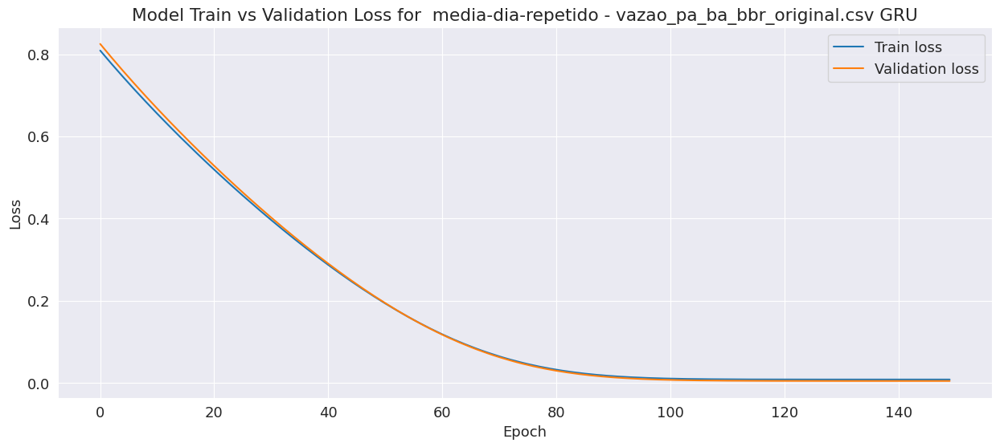

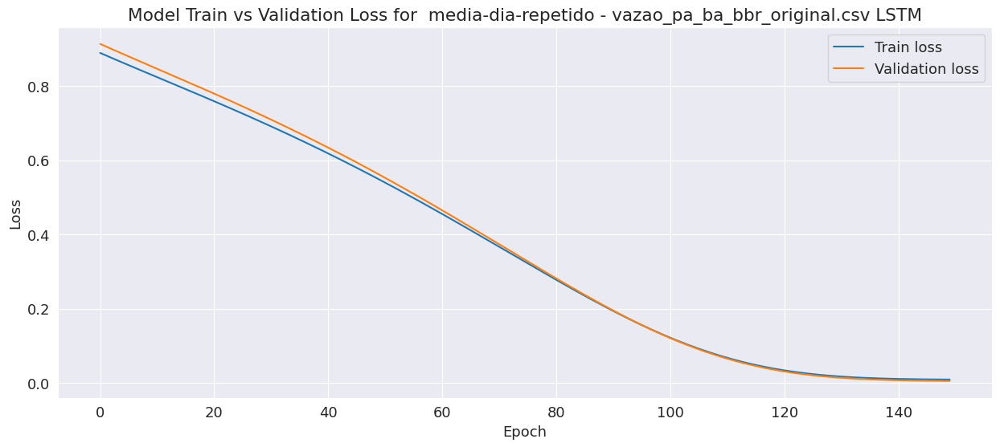

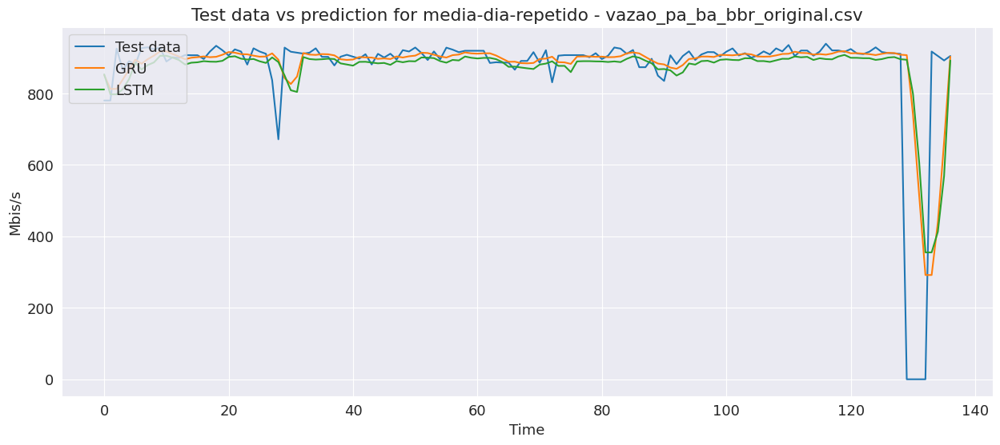

GRU:
Mean Absolute Error: 45.1647
Root Mean Square Error: 135.4553

LSTM:
Mean Absolute Error: 54.7453
Root Mean Square Error: 142.3347

###################### media-dia-repetido - vazao_pr_am_bbr_original.csv ##########################
Epoch 1/150
15/15 [==============================] - 4s 50ms/step - loss: 0.9413 - root_mean_squared_error: 0.9702 - val_loss: 0.9372 - val_root_mean_squared_error: 0.9681
Epoch 2/150
15/15 [==============================] - 0s 7ms/step - loss: 0.9197 - root_mean_squared_error: 0.9590 - val_loss: 0.9156 - val_root_mean_squared_error: 0.9569
Epoch 3/150
15/15 [==============================] - 0s 10ms/step - loss: 0.8985 - root_mean_squared_error: 0.9479 - val_loss: 0.8942 - val_root_mean_squared_error: 0.9456
Epoch 4/150
15/15 [==============================] - 0s 13ms/step - loss: 0.8775 - root_mean_squared_error: 0.9367 - val_loss: 0.8732 - val_root_mean_squared_error: 0.9345
Epoch 5/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8

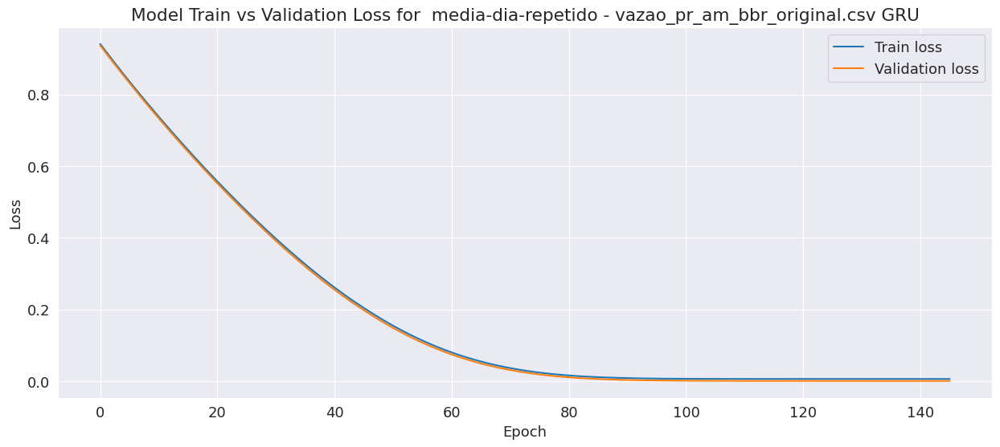

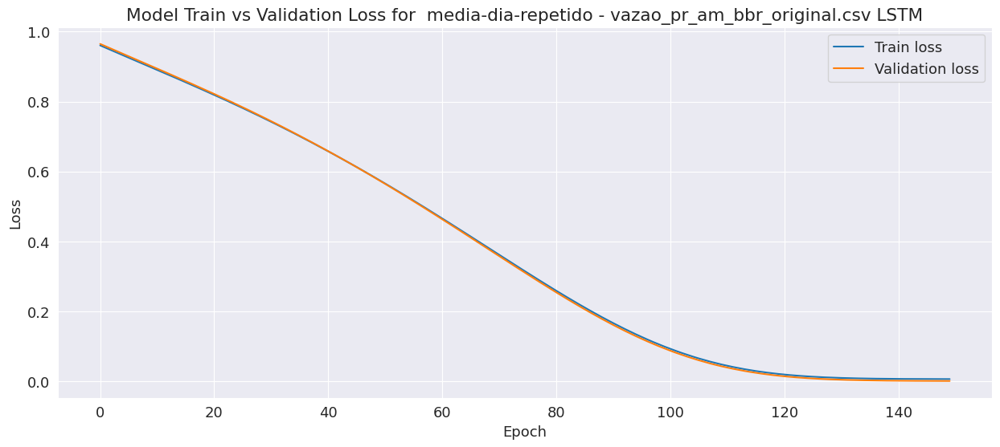

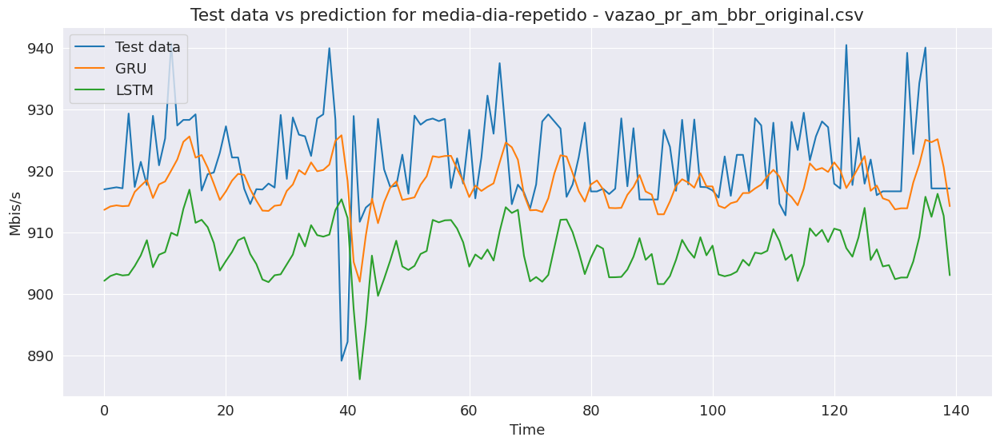

GRU:
Mean Absolute Error: 6.4629
Root Mean Square Error: 8.8987

LSTM:
Mean Absolute Error: 15.7188
Root Mean Square Error: 17.1692

###################### media-dia-repetido - vazao_rr_rs_bbr_original.csv ##########################
Epoch 1/150
12/12 [==============================] - 5s 66ms/step - loss: 0.5701 - root_mean_squared_error: 0.7551 - val_loss: 0.5907 - val_root_mean_squared_error: 0.7686
Epoch 2/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5581 - root_mean_squared_error: 0.7471 - val_loss: 0.5786 - val_root_mean_squared_error: 0.7607
Epoch 3/150
12/12 [==============================] - 0s 7ms/step - loss: 0.5462 - root_mean_squared_error: 0.7391 - val_loss: 0.5667 - val_root_mean_squared_error: 0.7528
Epoch 4/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5345 - root_mean_squared_error: 0.7311 - val_loss: 0.5550 - val_root_mean_squared_error: 0.7450
Epoch 5/150
12/12 [==============================] - 0s 8ms/step - loss: 0.5230 - 

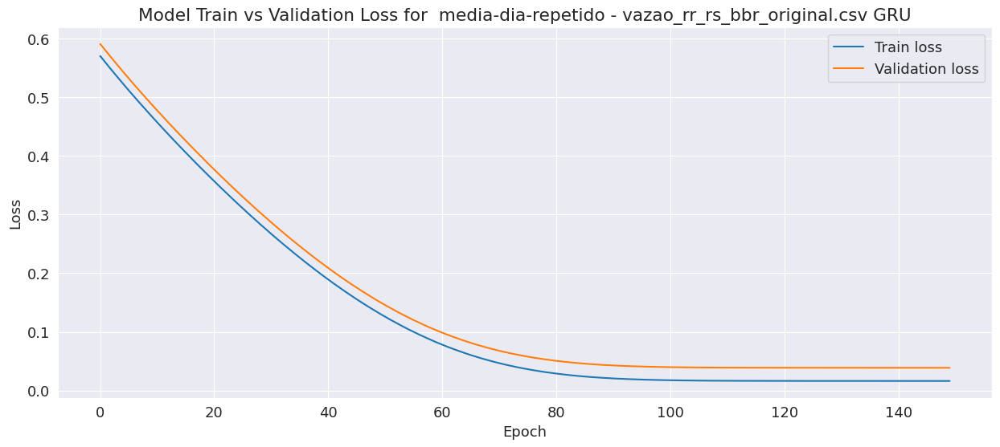

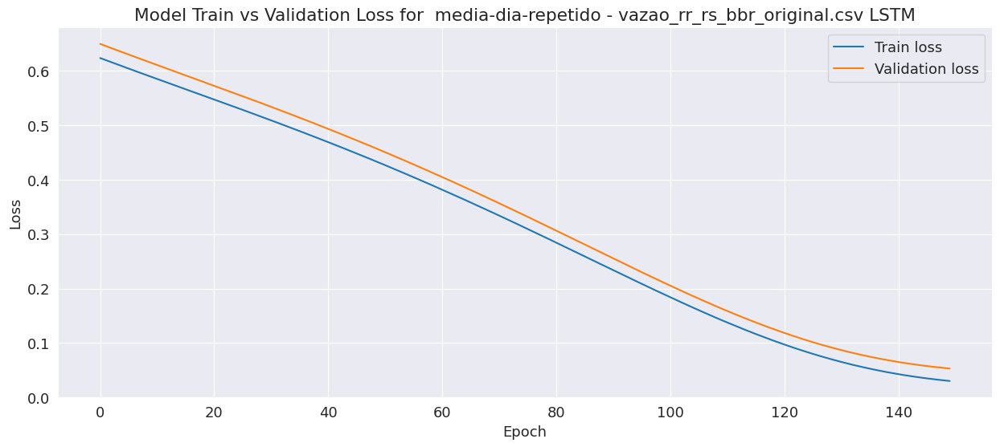

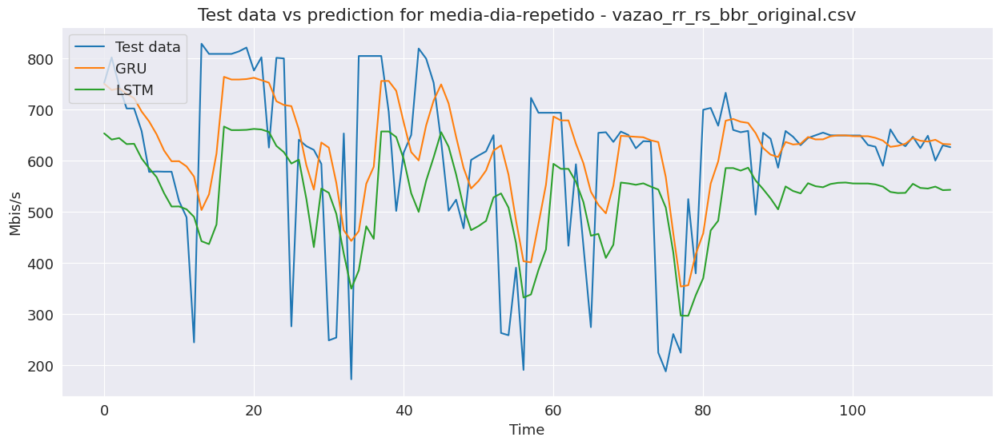

GRU:
Mean Absolute Error: 101.7361
Root Mean Square Error: 150.5982

LSTM:
Mean Absolute Error: 141.0220
Root Mean Square Error: 170.7678

###################### media-movel - preenchido bbr esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
15/15 [==============================] - 5s 106ms/step - loss: 0.5743 - root_mean_squared_error: 0.7578 - val_loss: 0.5010 - val_root_mean_squared_error: 0.7078
Epoch 2/150
15/15 [==============================] - 0s 7ms/step - loss: 0.5575 - root_mean_squared_error: 0.7467 - val_loss: 0.4870 - val_root_mean_squared_error: 0.6979
Epoch 3/150
15/15 [==============================] - 0s 7ms/step - loss: 0.5412 - root_mean_squared_error: 0.7356 - val_loss: 0.4733 - val_root_mean_squared_error: 0.6880
Epoch 4/150
15/15 [==============================] - 0s 7ms/step - loss: 0.5251 - root_mean_squared_error: 0.7246 - val_loss: 0.4598 - val_root_mean_squared_error: 0.6781
Epoch 5/150
15/15 [==============================] - 0s 7ms/ste

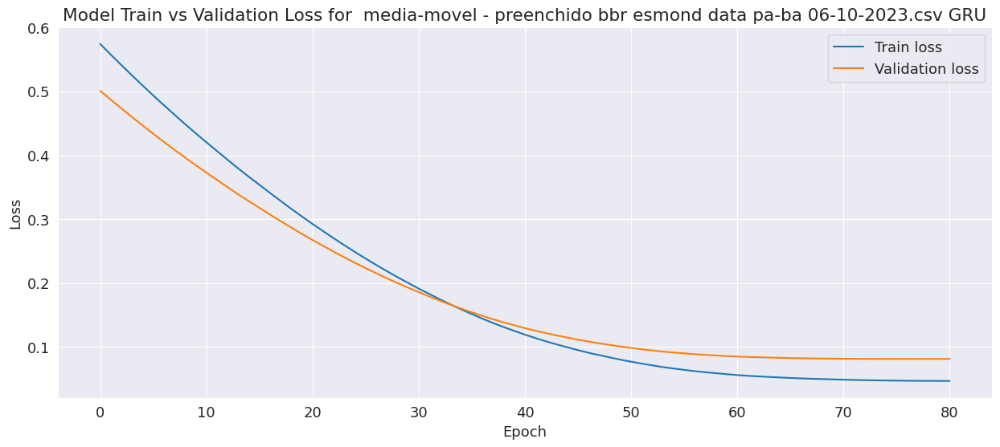

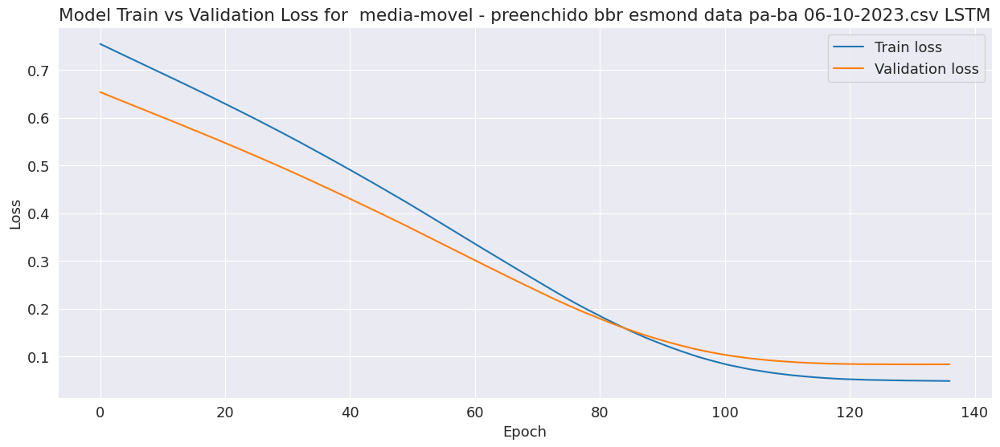

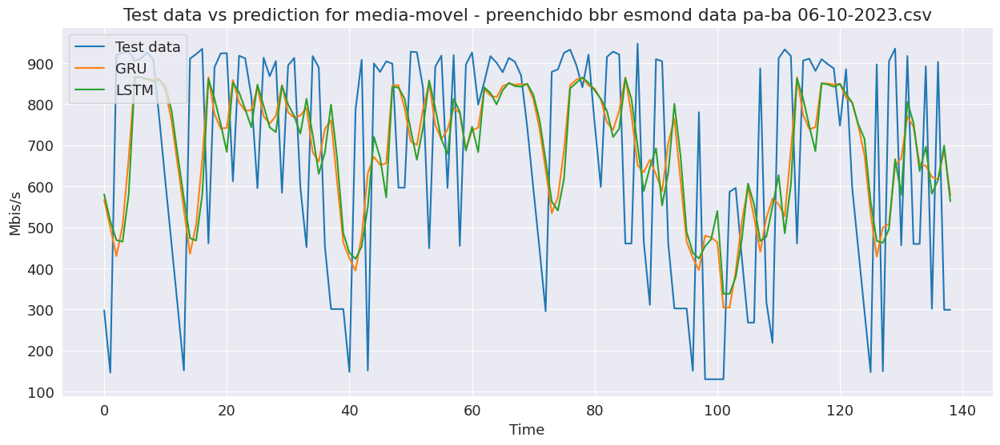

GRU:
Mean Absolute Error: 231.5734
Root Mean Square Error: 262.6258

LSTM:
Mean Absolute Error: 233.1816
Root Mean Square Error: 266.2308

###################### media-movel - preenchido bbr esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 49ms/step - loss: 0.6711 - root_mean_squared_error: 0.8192 - val_loss: 0.5347 - val_root_mean_squared_error: 0.7313
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.6552 - root_mean_squared_error: 0.8094 - val_loss: 0.5222 - val_root_mean_squared_error: 0.7226
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.6392 - root_mean_squared_error: 0.7995 - val_loss: 0.5100 - val_root_mean_squared_error: 0.7141
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.6239 - root_mean_squared_error: 0.7899 - val_loss: 0.4979 - val_root_mean_squared_error: 0.7056
Epoch 5/150
14/14 [==============================] - 0s 7ms/step

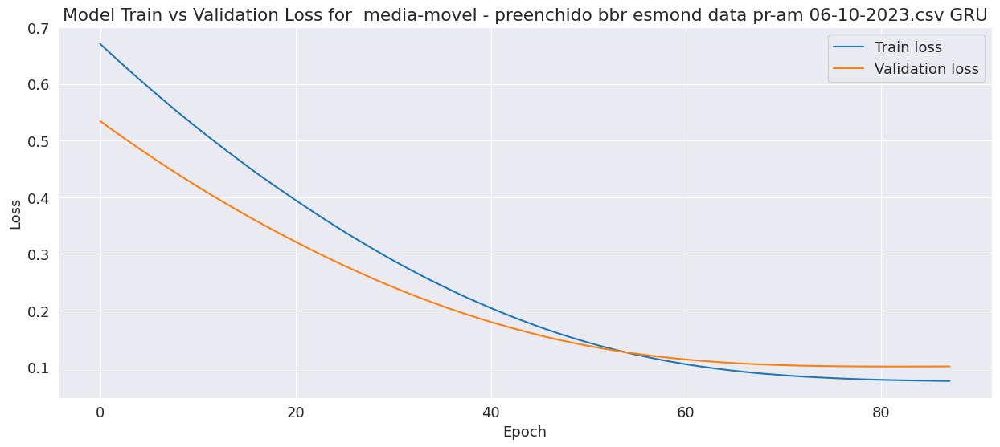

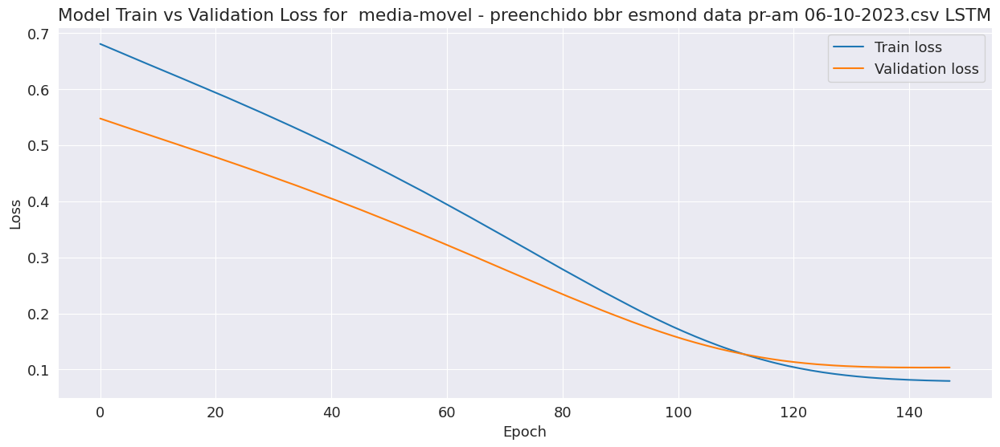

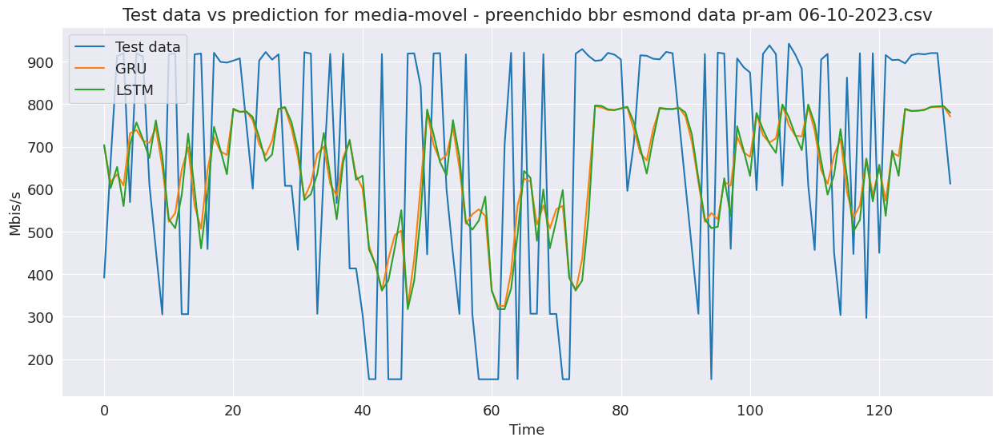

GRU:
Mean Absolute Error: 246.4720
Root Mean Square Error: 272.9153

LSTM:
Mean Absolute Error: 248.1600
Root Mean Square Error: 277.6471

###################### media-movel - preenchido cubic esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
15/15 [==============================] - 8s 99ms/step - loss: 0.8140 - root_mean_squared_error: 0.9022 - val_loss: 0.6967 - val_root_mean_squared_error: 0.8347
Epoch 2/150
15/15 [==============================] - 0s 11ms/step - loss: 0.7958 - root_mean_squared_error: 0.8920 - val_loss: 0.6814 - val_root_mean_squared_error: 0.8255
Epoch 3/150
15/15 [==============================] - 0s 11ms/step - loss: 0.7780 - root_mean_squared_error: 0.8820 - val_loss: 0.6665 - val_root_mean_squared_error: 0.8164
Epoch 4/150
15/15 [==============================] - 0s 12ms/step - loss: 0.7604 - root_mean_squared_error: 0.8720 - val_loss: 0.6517 - val_root_mean_squared_error: 0.8073
Epoch 5/150
15/15 [==============================] - 0s 12m

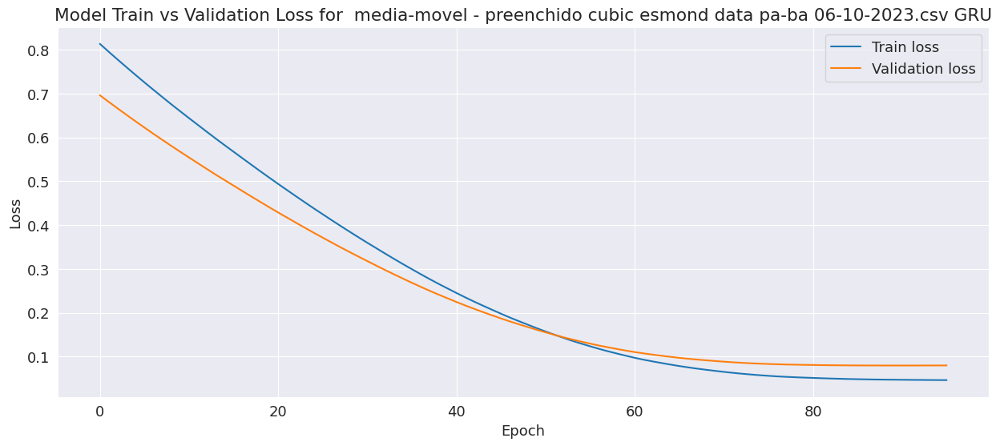

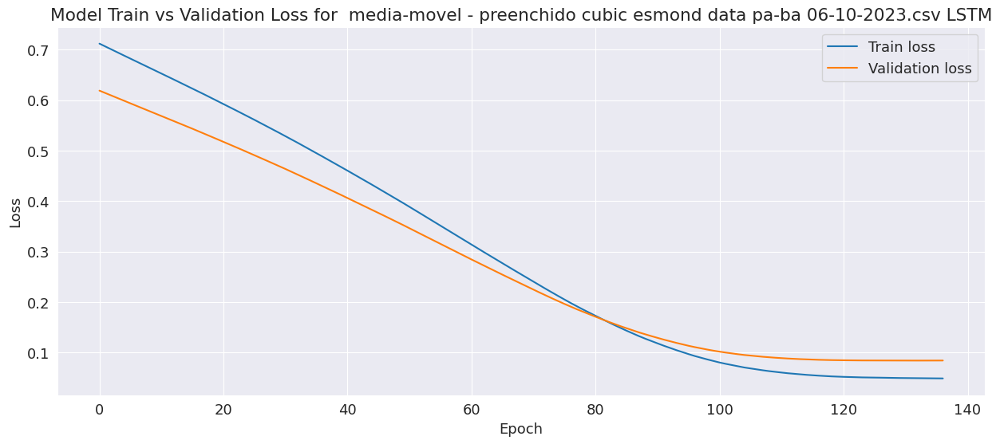

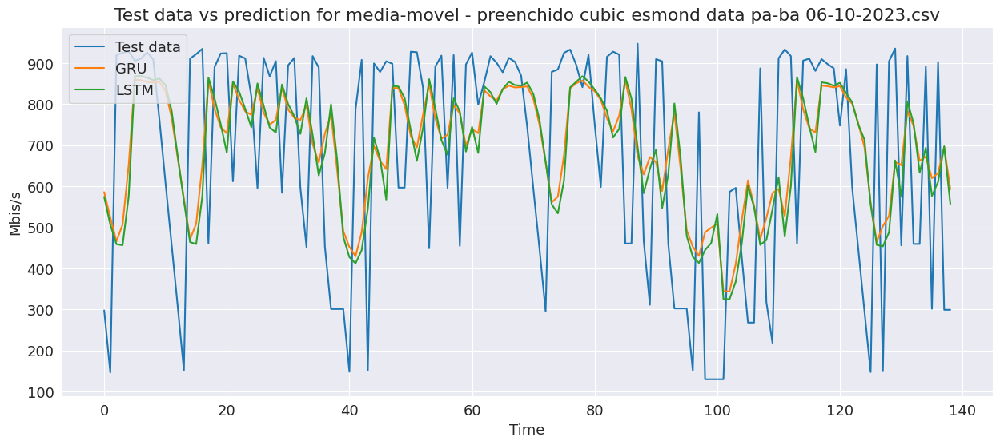

GRU:
Mean Absolute Error: 232.2116
Root Mean Square Error: 262.4978

LSTM:
Mean Absolute Error: 233.1692
Root Mean Square Error: 266.9407

###################### media-movel - preenchido cubic esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 5s 64ms/step - loss: 0.7728 - root_mean_squared_error: 0.8791 - val_loss: 0.6108 - val_root_mean_squared_error: 0.7816
Epoch 2/150
14/14 [==============================] - 0s 8ms/step - loss: 0.7560 - root_mean_squared_error: 0.8695 - val_loss: 0.5977 - val_root_mean_squared_error: 0.7731
Epoch 3/150
14/14 [==============================] - 0s 8ms/step - loss: 0.7393 - root_mean_squared_error: 0.8598 - val_loss: 0.5849 - val_root_mean_squared_error: 0.7648
Epoch 4/150
14/14 [==============================] - 0s 8ms/step - loss: 0.7231 - root_mean_squared_error: 0.8504 - val_loss: 0.5721 - val_root_mean_squared_error: 0.7564
Epoch 5/150
14/14 [==============================] - 0s 8ms/st

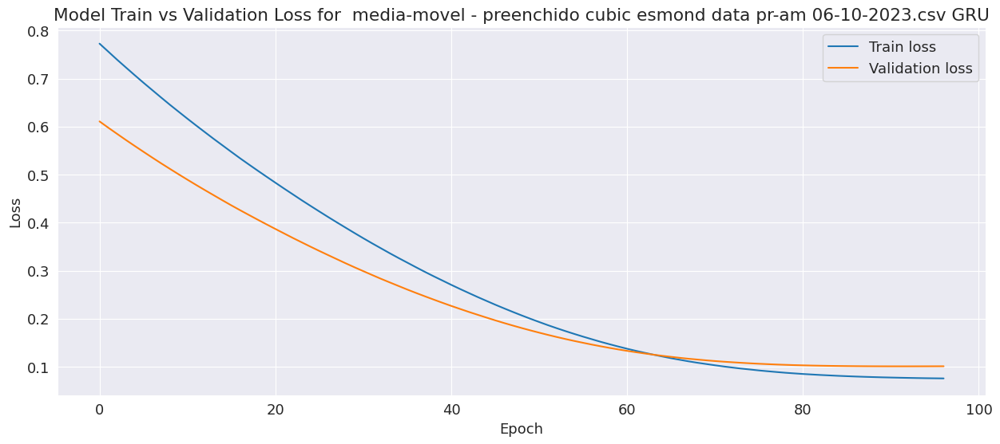

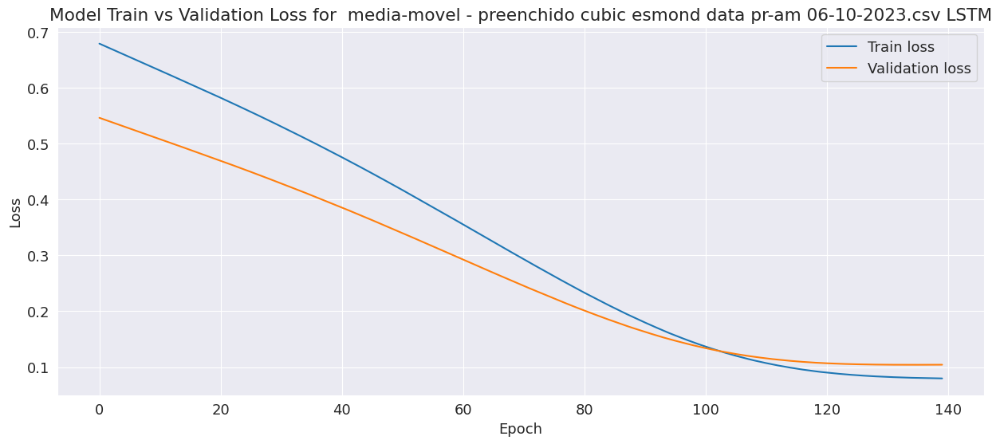

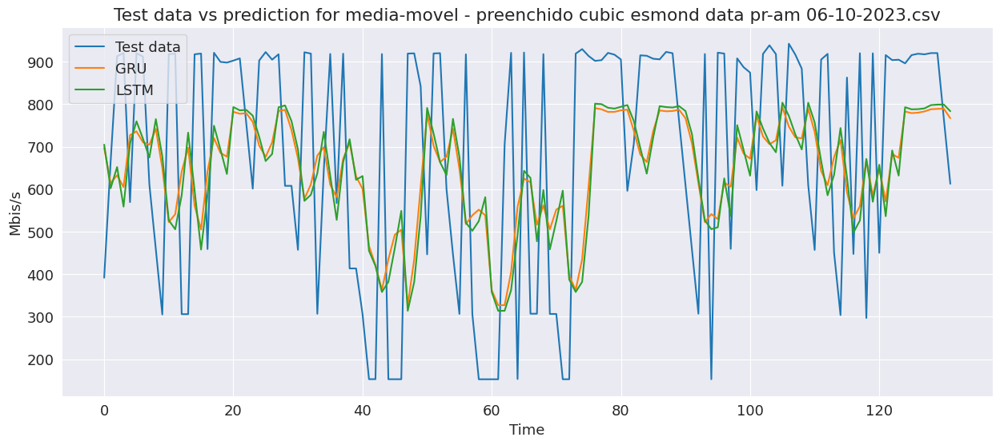

GRU:
Mean Absolute Error: 246.8981
Root Mean Square Error: 273.1441

LSTM:
Mean Absolute Error: 248.0869
Root Mean Square Error: 278.0170

###################### mediana-movel - preenchido bbr esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
15/15 [==============================] - 5s 54ms/step - loss: 0.9291 - root_mean_squared_error: 0.9639 - val_loss: 0.9107 - val_root_mean_squared_error: 0.9543
Epoch 2/150
15/15 [==============================] - 0s 7ms/step - loss: 0.9068 - root_mean_squared_error: 0.9523 - val_loss: 0.8886 - val_root_mean_squared_error: 0.9427
Epoch 3/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8849 - root_mean_squared_error: 0.9407 - val_loss: 0.8669 - val_root_mean_squared_error: 0.9311
Epoch 4/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8633 - root_mean_squared_error: 0.9291 - val_loss: 0.8455 - val_root_mean_squared_error: 0.9195
Epoch 5/150
15/15 [==============================] - 0s 7ms/st

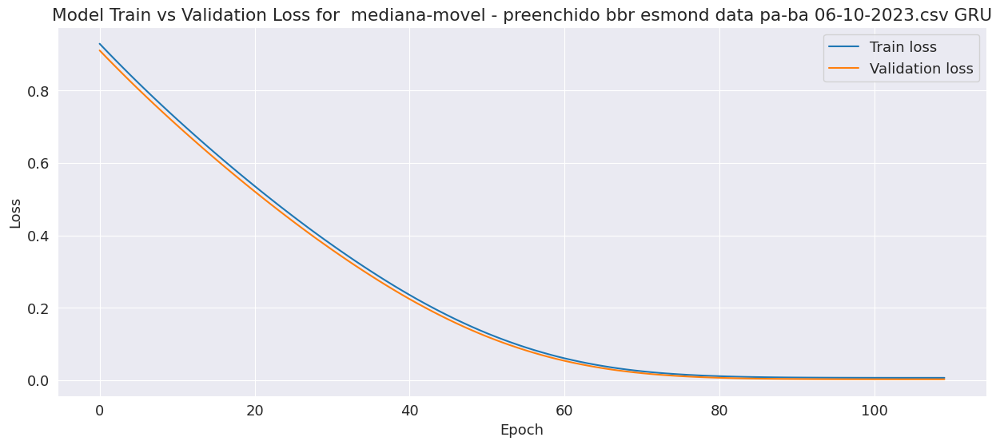

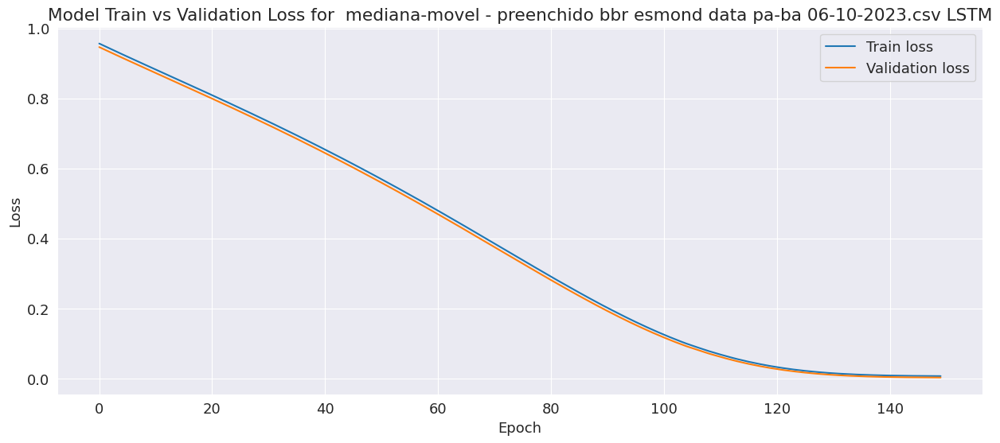

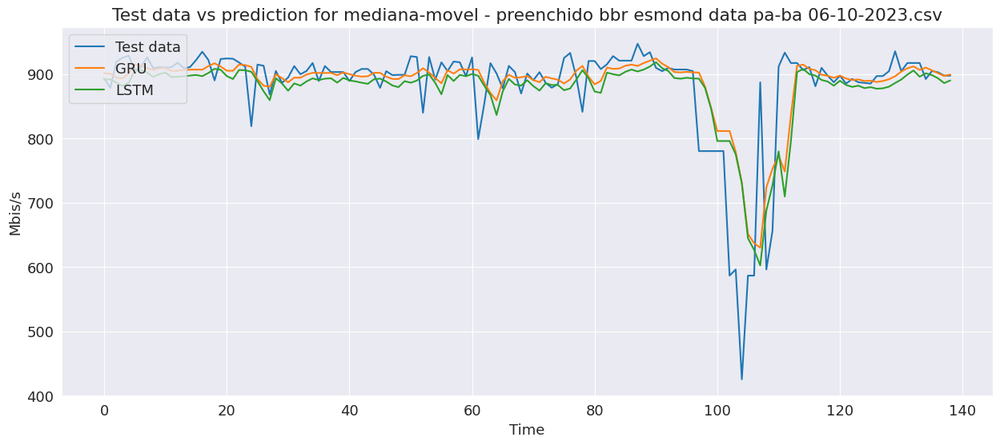

GRU:
Mean Absolute Error: 27.9344
Root Mean Square Error: 55.5691

LSTM:
Mean Absolute Error: 32.1938
Root Mean Square Error: 57.6328

###################### mediana-movel - preenchido bbr esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 57ms/step - loss: 1.0576 - root_mean_squared_error: 1.0284 - val_loss: 0.9928 - val_root_mean_squared_error: 0.9964
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 1.0356 - root_mean_squared_error: 1.0177 - val_loss: 0.9720 - val_root_mean_squared_error: 0.9859
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 1.0140 - root_mean_squared_error: 1.0070 - val_loss: 0.9517 - val_root_mean_squared_error: 0.9755
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.9927 - root_mean_squared_error: 0.9964 - val_loss: 0.9317 - val_root_mean_squared_error: 0.9652
Epoch 5/150
14/14 [==============================] - 0s 7ms/step -

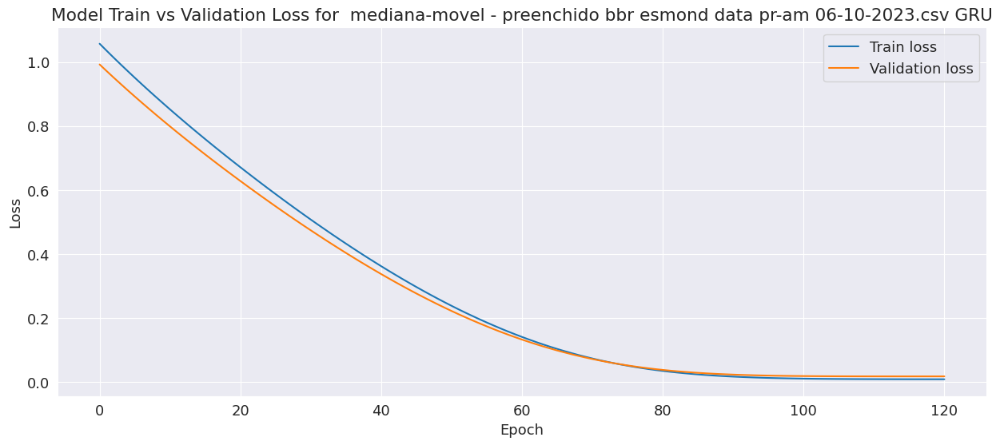

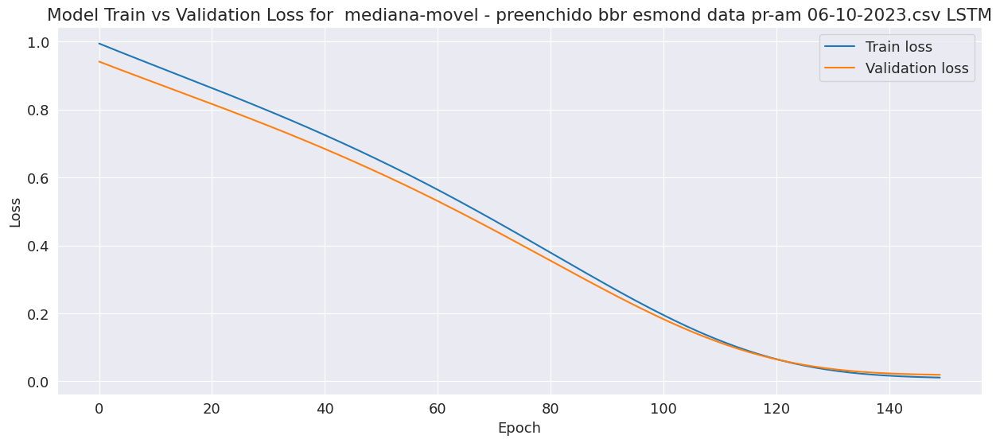

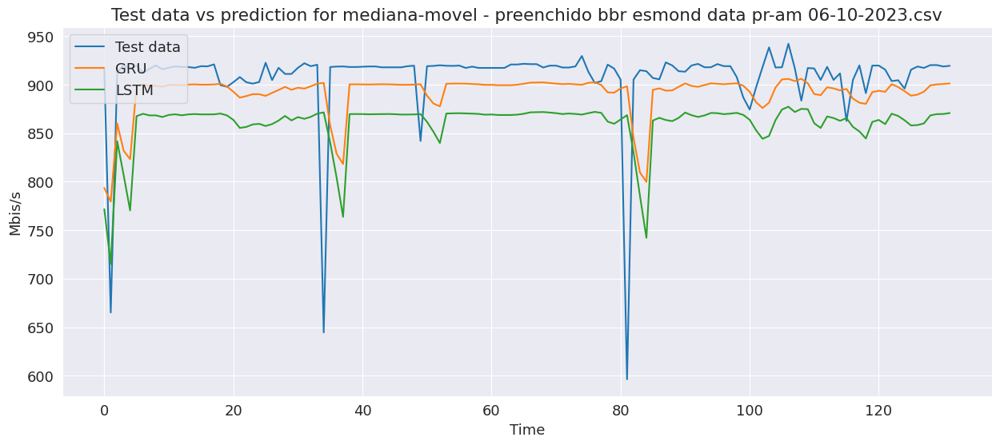

GRU:
Mean Absolute Error: 29.3170
Root Mean Square Error: 48.3866

LSTM:
Mean Absolute Error: 56.7546
Root Mean Square Error: 66.0701

###################### mediana-movel - preenchido cubic esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 51ms/step - loss: 0.6964 - root_mean_squared_error: 0.8345 - val_loss: 0.6630 - val_root_mean_squared_error: 0.8142
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.6826 - root_mean_squared_error: 0.8262 - val_loss: 0.6497 - val_root_mean_squared_error: 0.8060
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.6690 - root_mean_squared_error: 0.8179 - val_loss: 0.6366 - val_root_mean_squared_error: 0.7979
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.6555 - root_mean_squared_error: 0.8097 - val_loss: 0.6236 - val_root_mean_squared_error: 0.7897
Epoch 5/150
14/14 [==============================] - 0s 7ms/step

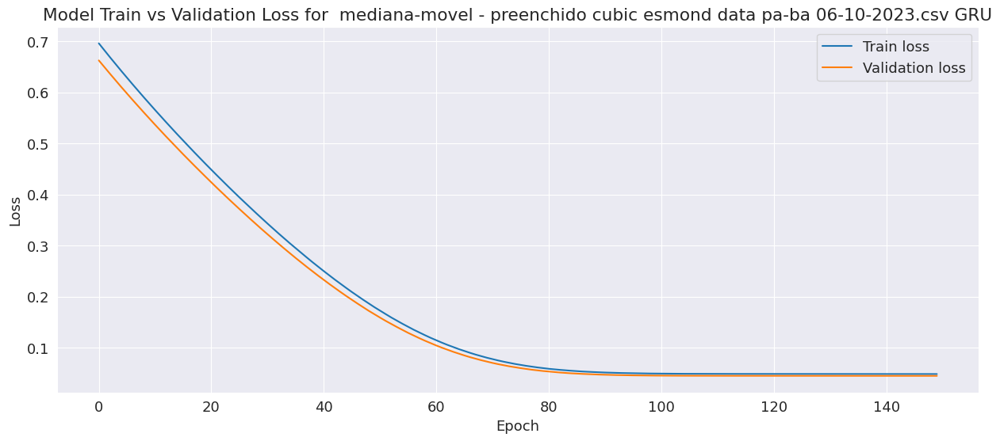

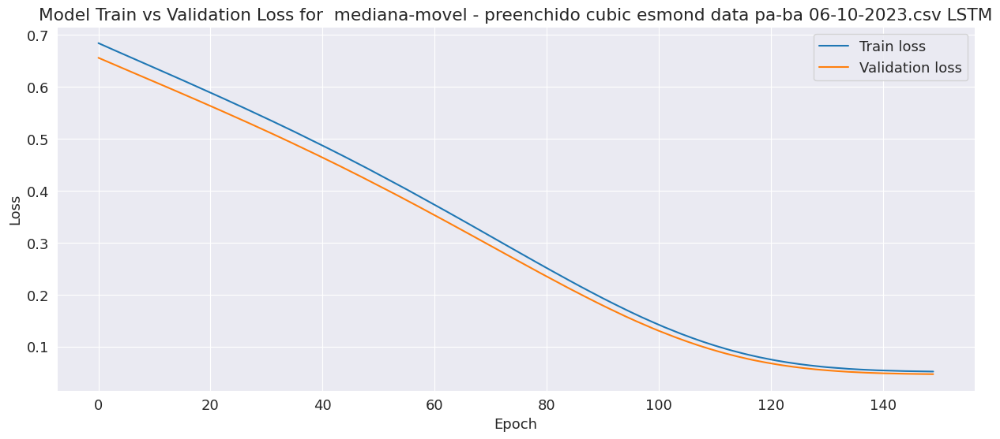

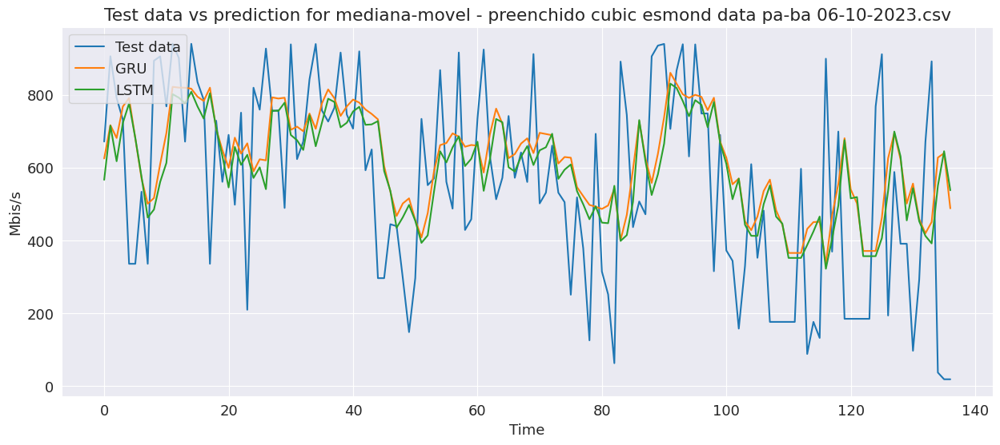

GRU:
Mean Absolute Error: 205.4781
Root Mean Square Error: 251.1149

LSTM:
Mean Absolute Error: 201.8374
Root Mean Square Error: 251.0682

###################### mediana-movel - preenchido cubic esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 52ms/step - loss: 0.6103 - root_mean_squared_error: 0.7812 - val_loss: 0.5736 - val_root_mean_squared_error: 0.7574
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.5979 - root_mean_squared_error: 0.7732 - val_loss: 0.5619 - val_root_mean_squared_error: 0.7496
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.5856 - root_mean_squared_error: 0.7653 - val_loss: 0.5503 - val_root_mean_squared_error: 0.7418
Epoch 4/150
14/14 [==============================] - 0s 8ms/step - loss: 0.5735 - root_mean_squared_error: 0.7573 - val_loss: 0.5389 - val_root_mean_squared_error: 0.7341
Epoch 5/150
14/14 [==============================] - 0s 7ms/

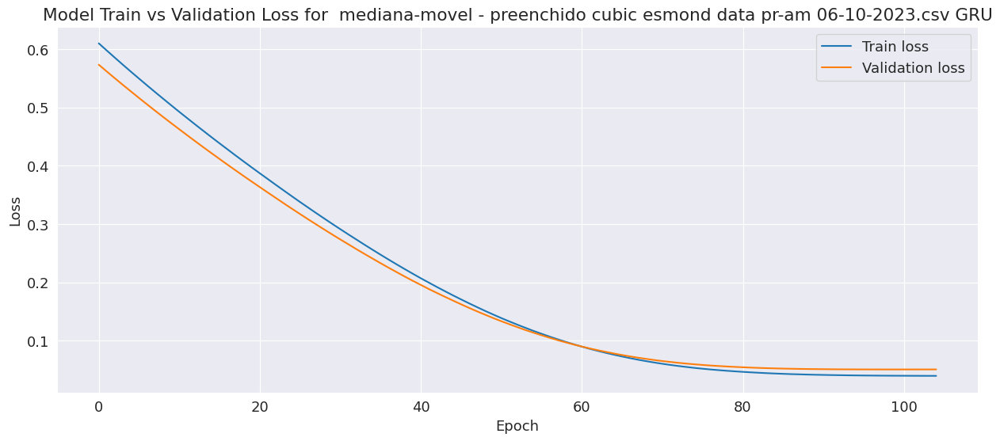

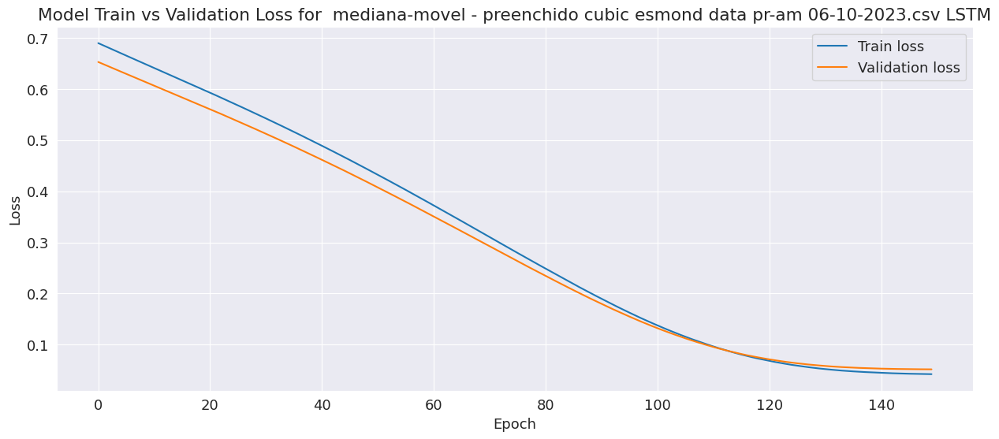

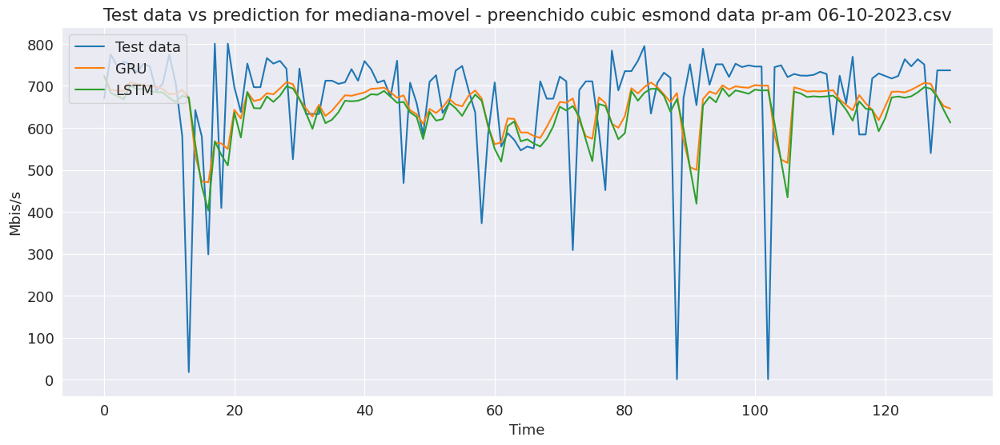

GRU:
Mean Absolute Error: 90.7729
Root Mean Square Error: 142.0683

LSTM:
Mean Absolute Error: 98.3970
Root Mean Square Error: 146.0794

###################### multi-time - preenchido bbr esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
15/15 [==============================] - 5s 49ms/step - loss: 0.8963 - root_mean_squared_error: 0.9467 - val_loss: 0.8768 - val_root_mean_squared_error: 0.9364
Epoch 2/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8786 - root_mean_squared_error: 0.9373 - val_loss: 0.8593 - val_root_mean_squared_error: 0.9270
Epoch 3/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8611 - root_mean_squared_error: 0.9280 - val_loss: 0.8421 - val_root_mean_squared_error: 0.9177
Epoch 4/150
15/15 [==============================] - 0s 7ms/step - loss: 0.8439 - root_mean_squared_error: 0.9186 - val_loss: 0.8250 - val_root_mean_squared_error: 0.9083
Epoch 5/150
15/15 [==============================] - 0s 7ms/step - 

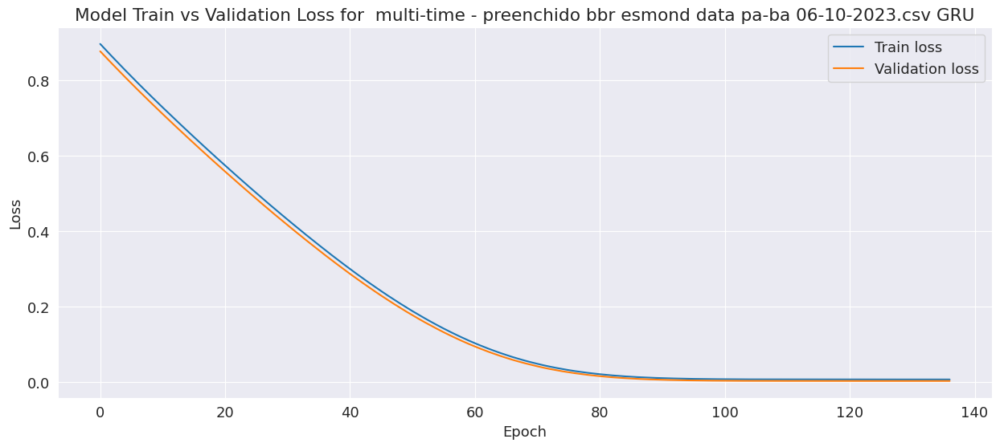

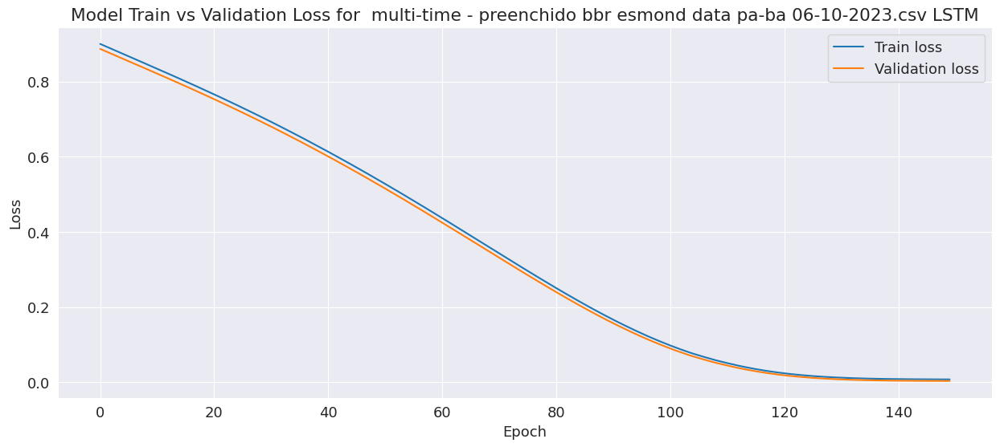

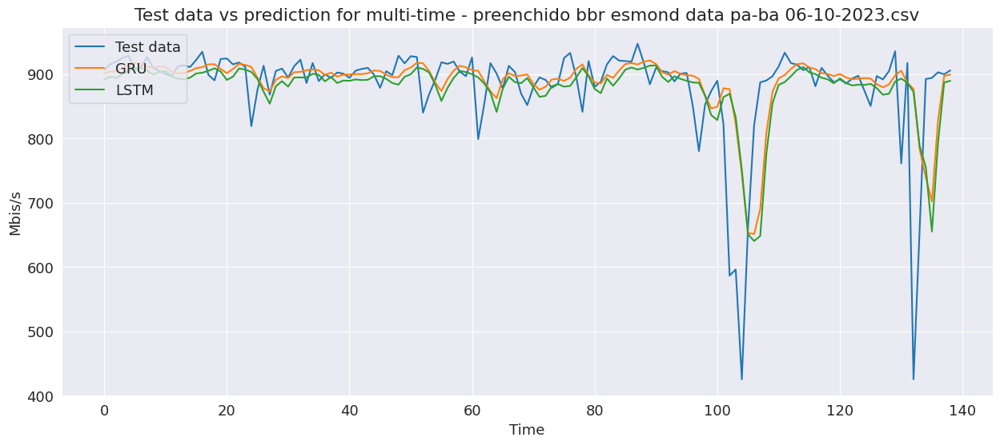

GRU:
Mean Absolute Error: 34.2338
Root Mean Square Error: 71.3928

LSTM:
Mean Absolute Error: 38.5083
Root Mean Square Error: 74.5836

###################### multi-time - preenchido bbr esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 55ms/step - loss: 1.0865 - root_mean_squared_error: 1.0424 - val_loss: 1.0021 - val_root_mean_squared_error: 1.0010
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 1.0656 - root_mean_squared_error: 1.0323 - val_loss: 0.9825 - val_root_mean_squared_error: 0.9912
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 1.0449 - root_mean_squared_error: 1.0222 - val_loss: 0.9633 - val_root_mean_squared_error: 0.9815
Epoch 4/150
14/14 [==============================] - 0s 8ms/step - loss: 1.0246 - root_mean_squared_error: 1.0122 - val_loss: 0.9445 - val_root_mean_squared_error: 0.9719
Epoch 5/150
14/14 [==============================] - 0s 7ms/step - lo

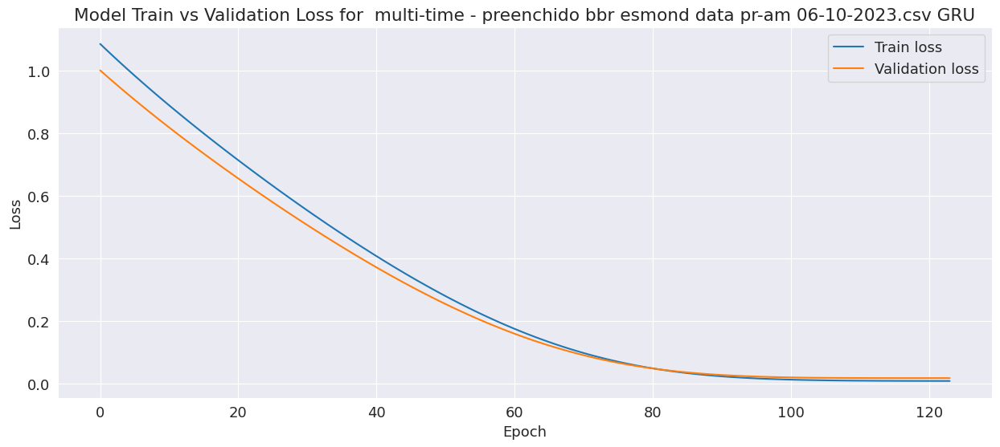

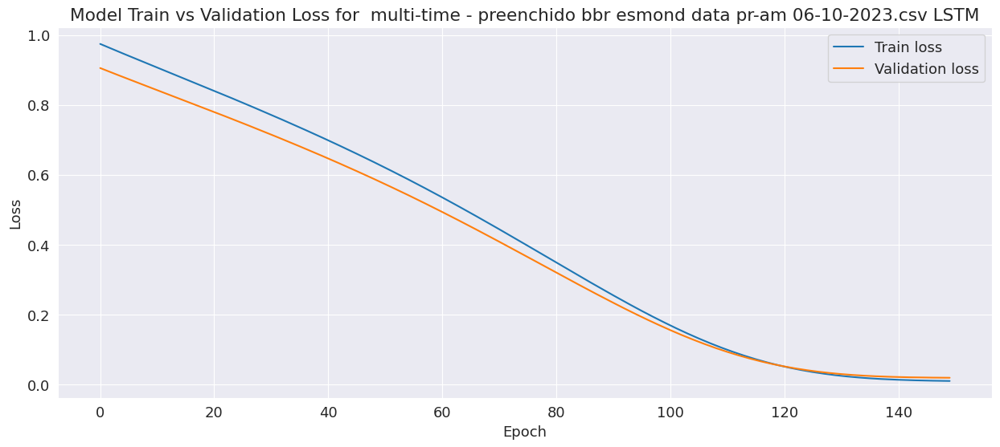

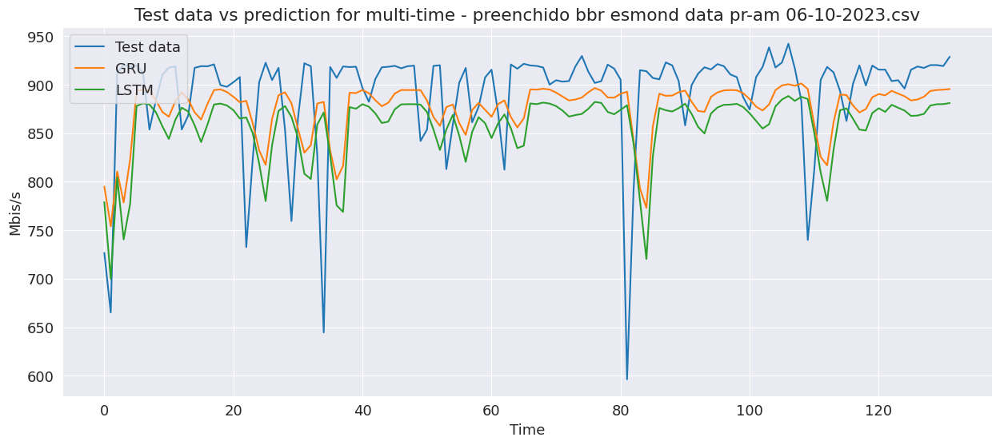

GRU:
Mean Absolute Error: 44.0797
Root Mean Square Error: 61.2646

LSTM:
Mean Absolute Error: 55.6043
Root Mean Square Error: 70.9716

###################### multi-time - preenchido cubic esmond data pa-ba 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 59ms/step - loss: 0.7069 - root_mean_squared_error: 0.8408 - val_loss: 0.6910 - val_root_mean_squared_error: 0.8313
Epoch 2/150
14/14 [==============================] - 0s 9ms/step - loss: 0.6913 - root_mean_squared_error: 0.8314 - val_loss: 0.6756 - val_root_mean_squared_error: 0.8220
Epoch 3/150
14/14 [==============================] - 0s 8ms/step - loss: 0.6758 - root_mean_squared_error: 0.8221 - val_loss: 0.6604 - val_root_mean_squared_error: 0.8126
Epoch 4/150
14/14 [==============================] - 0s 8ms/step - loss: 0.6607 - root_mean_squared_error: 0.8129 - val_loss: 0.6452 - val_root_mean_squared_error: 0.8033
Epoch 5/150
14/14 [==============================] - 0s 8ms/step - 

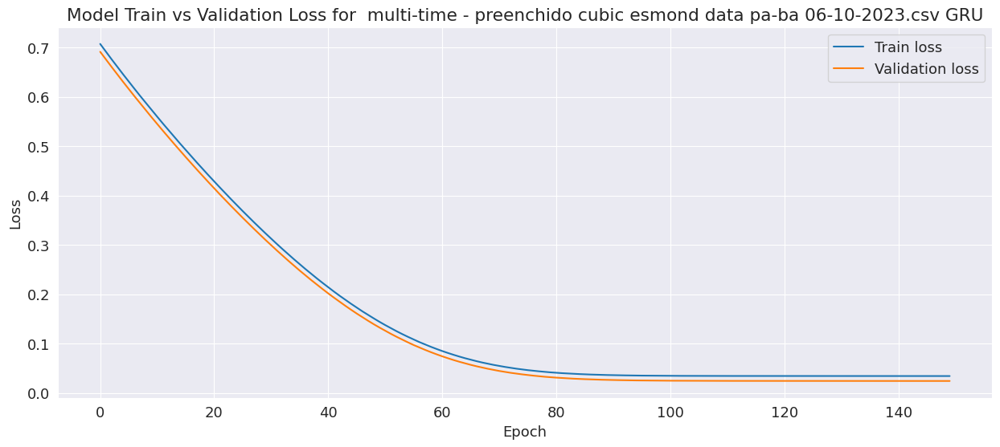

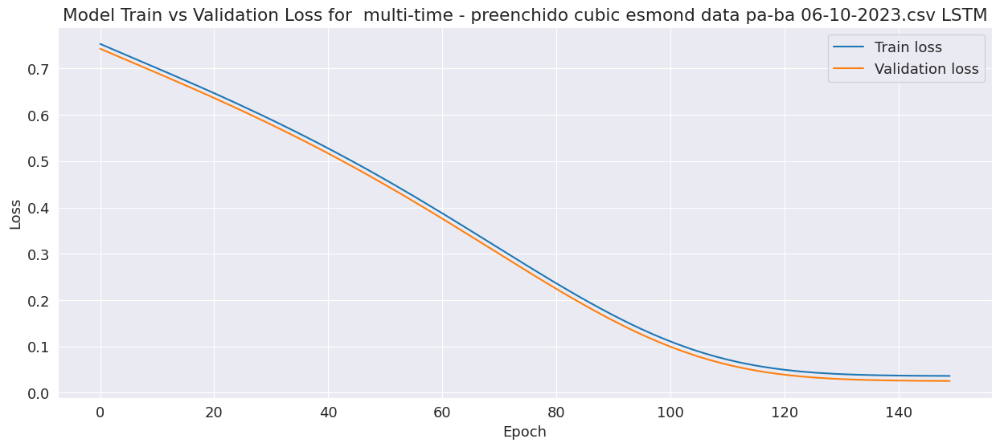

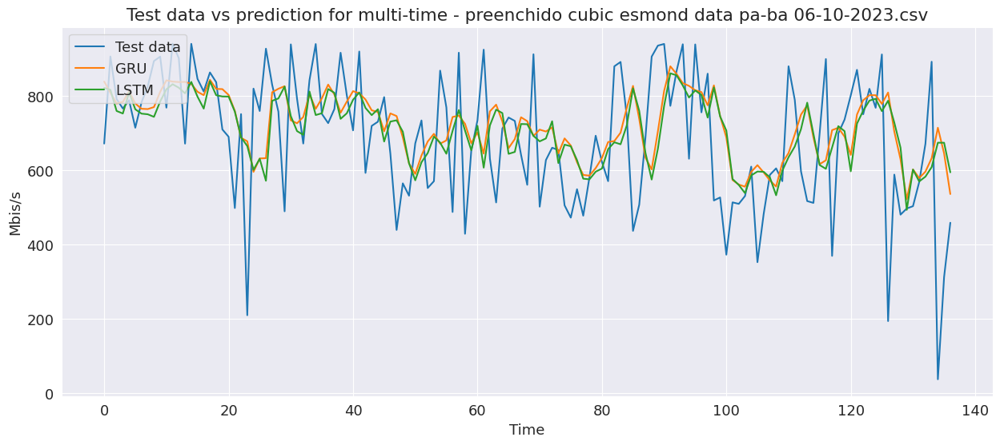

GRU:
Mean Absolute Error: 130.7143
Root Mean Square Error: 173.5915

LSTM:
Mean Absolute Error: 132.2639
Root Mean Square Error: 174.3522

###################### multi-time - preenchido cubic esmond data pr-am 06-10-2023.csv ##########################
Epoch 1/150
14/14 [==============================] - 4s 54ms/step - loss: 0.7231 - root_mean_squared_error: 0.8503 - val_loss: 0.6779 - val_root_mean_squared_error: 0.8234
Epoch 2/150
14/14 [==============================] - 0s 7ms/step - loss: 0.7084 - root_mean_squared_error: 0.8417 - val_loss: 0.6641 - val_root_mean_squared_error: 0.8149
Epoch 3/150
14/14 [==============================] - 0s 7ms/step - loss: 0.6939 - root_mean_squared_error: 0.8330 - val_loss: 0.6505 - val_root_mean_squared_error: 0.8066
Epoch 4/150
14/14 [==============================] - 0s 7ms/step - loss: 0.6797 - root_mean_squared_error: 0.8244 - val_loss: 0.6372 - val_root_mean_squared_error: 0.7982
Epoch 5/150
14/14 [==============================] - 0s 7ms/ste

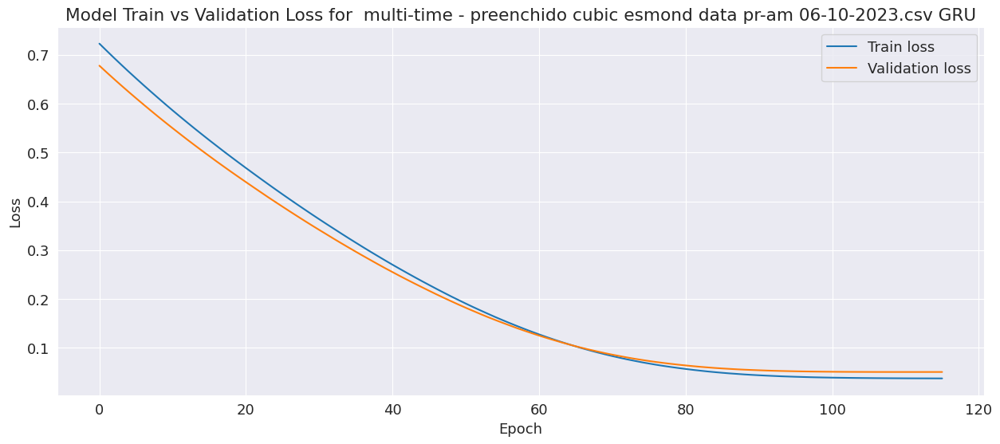

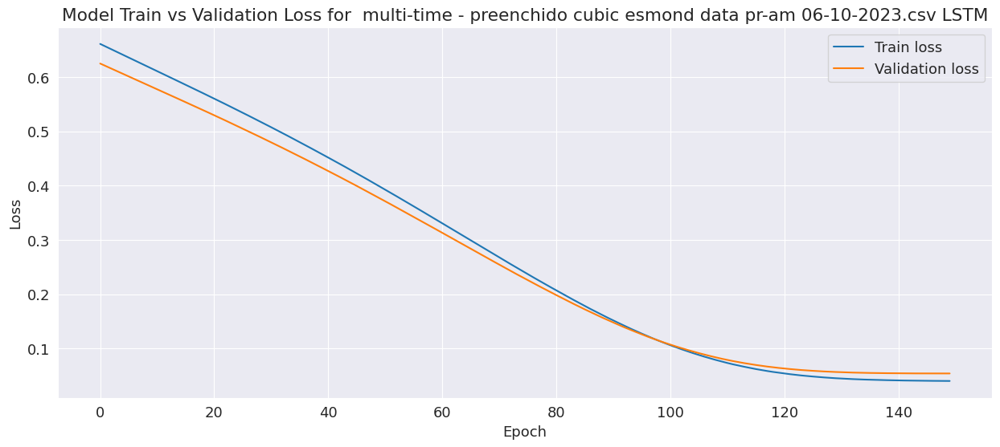

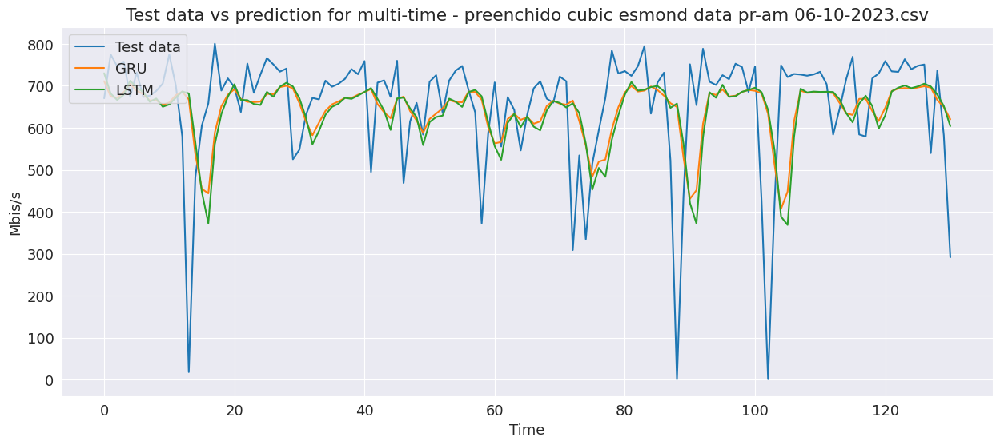

GRU:
Mean Absolute Error: 95.8506
Root Mean Square Error: 146.7390

LSTM:
Mean Absolute Error: 102.4060
Root Mean Square Error: 154.5783



In [11]:
# Model Trainnig and Prediction

import os
import re
#treinamento e predição
# Defina o diretório raiz onde deseja iniciar a busca
diretorio_raiz = '../../datasets/dados-vazao-imputados'

evaluation = {}

# Itere pelos diretórios e subdiretórios
for pasta_raiz, subpastas, arquivos in os.walk(diretorio_raiz):
    for arquivo in arquivos:
        # Verifique se o arquivo é um arquivo CSV
        if arquivo.endswith('.csv'):
            # Construa o caminho completo para o arquivo
            caminho_arquivo = os.path.join(pasta_raiz, arquivo)
            # print(caminho_arquivo)

        try:
                # Título parser
                # partes = caminho_arquivo.split("\\")
                # if len(partes) >= 2:
                # #     substring_desejada = "/".join(partes[1:])  # Acesse as partes a partir da segunda e as una com barras invertidas
                
                partes = caminho_arquivo.split("/")
                substring_desejada = partes[4] + ' - ' + partes[5]  # Acesse as partes a partir da segunda e as una com barras invertidas
                
                df = pd.read_csv(caminho_arquivo, index_col='Data')
                
                # Regularizar o dataset para megabits/s
                bits_para_megabits(df, 'Vazao')

                # Visualização das séries
                # visualizacao_series(df, 'Vazao', substring_desejada)

                # print('média dataset: '+ str(df['Vazao'].mean()))
                
                # print(substring_desejada)

                print('###################### '+substring_desejada+' ##########################')

                #PREDICAO
                tamanho = int(len(df.index) * 0.8)

                # Set random seed to get the same result after each time running the code
                tf.random.set_seed(7)

                # Split train data and test data
                train_size = tamanho

                # train_data = df.WC.loc[:train_size] -----> it gives a series
                # Do not forget use iloc to select a number of rows
                train_data = df[:train_size]
                test_data = df[train_size:]
                
                # Criar uma instância do MinMaxScaler
                train_data = train_data['Vazao'].values.reshape(-1, 1)
                test_data = test_data['Vazao'].values.reshape(-1, 1)

                scaler = MinMaxScaler().fit(train_data)

                train_scaled = scaler.transform(train_data)
                test_scaled = scaler.transform(test_data)

                X_train, y_train = create_dataset(train_scaled)
                X_test, y_test = create_dataset(test_scaled)
            
                model_gru = create_gru(64, X_train)
                model_lstm = create_lstm(64, X_train)
                
                #######################################################################################
                # params_grid = create_gridSearch(model_gru, X_train, y_train)
                #######################################################################################


                history_gru = fit_model(model_gru, X_train, y_train, 'gru')
                history_lstm = fit_model(model_lstm, X_train, y_train, 'lstm')
                
                # Transform data back to original data space
                y_test = scaler.inverse_transform(y_test)
                y_train = scaler.inverse_transform(y_train)
                
                prediction_gru = prediction(model_gru, X_test, y_test, scaler, 'GRU', link = substring_desejada)
                prediction_lstm = prediction(model_lstm, X_test, y_test, scaler, 'LSTM', link=substring_desejada)

                plot_loss (history_gru, 'GRU', substring_desejada)
                plot_loss (history_lstm, 'LSTM', substring_desejada)

                plot_future(prediction_gru, prediction_lstm, y_test, link = substring_desejada)
                # lstm_forecast = plot_future(prediction_lstm, 'LSTM', y_test, link = substring_desejada)

                # plot_future_comparing_train_test (X_train, prediction_gru[1], 'GRU', substring_desejada)
                # plot_future_comparing_train_test (X_train, prediction_lstm[1], 'LSTM', substring_desejada)

                gru_evaluation = evaluate_prediction(prediction_gru, y_test, 'GRU')
                lstm_evaluation = evaluate_prediction(prediction_lstm, y_test, 'LSTM')


                # guardar valores de avaliação
                chave_gru = f"{substring_desejada}, {gru_evaluation[2]}"  # Crie uma chave baseada no valor de i
                tupla = (gru_evaluation[0], gru_evaluation[1])  # Crie uma tupla com valores baseados em i
                evaluation[chave_gru] = tupla  # Adicione a chave e a tupla ao dicionário

                chave_lstm = f"{substring_desejada}, {lstm_evaluation[2]}"  # Crie uma chave baseada no valor de i
                tupla = (lstm_evaluation[0], lstm_evaluation[1])  # Crie uma tupla com valores baseados em i
                evaluation[chave_lstm] = tupla  # Adicione a chave e a tupla ao dicionário

                # print(evaluation+'\n\n')
                    
        except pd.errors.EmptyDataError:
            # Arquivo vazio
            print(f"Arquivo: {arquivo} - O arquivo está vazio, subpasta: {pasta_raiz}")
        except Exception as e:
            # Tratar outras exceções, se necessário
                print(f"Arquivo: {arquivo}, subpasta: {pasta_raiz} - Erro: {str(e)}")

    
        novo_dicionario = {}
        import json
        
        # Itere pelo dicionário original
        for chave, valores in evaluation.items():
            valor1, valor2 = valores  # Desempacote os valores da tupla
            novo_dicionario[chave] = {'RMSE': valor1, 'MAE': valor2}

        with open('../../graficos/predicoes/round_2/evaluation_rmse_mae_2.json', 'w') as arquivo:
            json.dump(novo_dicionario, arquivo, indent=4)

    # with open('..\\..\\graficos\\predicoes\\round_2\\evaluation_rmse_mae_2.json', 'w') as arquivo:
    #     json.dump(novo_dicionario, arquivo, indent=4)
                

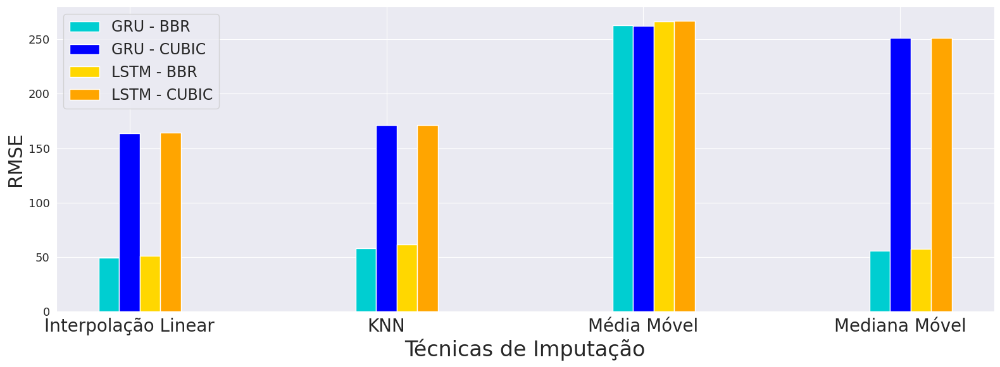

In [15]:
# Results PA-BA RMSE
# resultados referente a: '../../graficos/predicoes/round_2/evaluation_rmse_mae_2.json' que é
# resultado do treinamento com os hyperparametros em indicados em: '../../graficos/predicoes/round_2/hyperparams_2.txt'

import json
import matplotlib.pyplot as plt
import numpy as np


json_data = """
{
    "Interpolação Linear": [
      {"RMSE": 49.1656595492494, "MODELO": "GRU", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 50.895106296664906, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 52.89093576345165, "MODELO": "GRU", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 66.27586771760345, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 163.7536402553969, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 164.4494189110069, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 153.7524221737528, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PR-AM"},
      {"RMSE": 162.36095430547388, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PR-AM"}
    ],
    "KNN": [
      {"RMSE": 58.27211696536066, "MODELO": "GRU", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 61.56397645649821, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 48.2686337382006, "MODELO": "GRU", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 50.11289780679673, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 170.99390286197323, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 171.44232686161416, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 134.13692806013054, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PR-AM"},
      {"RMSE": 137.62774892075163, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PR-AM"}
    ],
    "Média Móvel": [
      {"RMSE": 262.62576432998407, "MODELO": "GRU", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 266.2307921843741, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 272.7989797854411, "MODELO": "GRU", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 277.60481655611756, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 262.497759104749, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 266.94066414611785, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 273.2646414573494, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PR-AM"},
      {"RMSE": 279.2394819182783, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PR-AM"}
    ],
    "Mediana Móvel": [
      {"RMSE": 55.569133774622046, "MODELO": "GRU", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 57.632766506417205, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 48.40798349140053, "MODELO": "GRU", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 64.51374974475104, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 251.11487261984317, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 251.0682412804039, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 141.88601538905303, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PR-AM"},
      {"RMSE": 144.71893528301663, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PR-AM"}
    ]
}
"""

# Carregar o JSON
data = json.loads(json_data)

# Dicionário para armazenar os valores de RMSE por grupo e configuração
rmse_values = {
    'Interpolação Linear': {'GRU_BBR_PA-BA': [], 'LSTM_CUBIC_PA-BA': [], 'LSTM_BBR_PA-BA': [], 'GRU_CUBIC_PA-BA': []},
    'KNN': {'GRU_BBR_PA-BA': [], 'LSTM_CUBIC_PA-BA': [], 'LSTM_BBR_PA-BA': [], 'GRU_CUBIC_PA-BA': []},
    'Média Móvel': {'GRU_BBR_PA-BA': [], 'LSTM_CUBIC_PA-BA': [], 'LSTM_BBR_PA-BA': [], 'GRU_CUBIC_PA-BA': []},
    'Mediana Móvel': {'GRU_BBR_PA-BA': [], 'LSTM_CUBIC_PA-BA': [], 'LSTM_BBR_PA-BA': [], 'GRU_CUBIC_PA-BA': []}
}

# Organizar os valores de RMSE no dicionário
for group, values in data.items():
    for item in values:
        rmse = item['RMSE']
        modelo = item['MODELO']
        tcp = item['TCP']
        link = item['LINK']
        
        if modelo == 'GRU' and tcp == 'BBR' and link == 'PA-BA':
            rmse_values[group]['GRU_BBR_PA-BA'].append(rmse)
        elif modelo == 'LSTM' and tcp == 'CUBIC' and link == 'PA-BA':
            rmse_values[group]['LSTM_CUBIC_PA-BA'].append(rmse)
        elif modelo == 'LSTM' and tcp == 'BBR' and link == 'PA-BA':
            rmse_values[group]['LSTM_BBR_PA-BA'].append(rmse)
        elif modelo == 'GRU' and tcp == 'CUBIC' and link == 'PA-BA':
            rmse_values[group]['GRU_CUBIC_PA-BA'].append(rmse)

# Criar o gráfico de barras
labels = list(rmse_values.keys())
x = np.arange(len(labels))
width = 0.08

fig, ax = plt.subplots()

# Adicionar as barras
bars1 = ax.bar(x - width, [np.mean(rmse_values[group]['GRU_BBR_PA-BA']) for group in labels], width, label='GRU - BBR', color='darkturquoise')
bars2 = ax.bar(x, [np.mean(rmse_values[group]['GRU_CUBIC_PA-BA']) for group in labels], width, label='GRU - CUBIC', color='blue')
bars3 = ax.bar(x + width, [np.mean(rmse_values[group]['LSTM_BBR_PA-BA']) for group in labels], width, label='LSTM - BBR', color='gold')
bars4 = ax.bar(x + 2*width, [np.mean(rmse_values[group]['LSTM_CUBIC_PA-BA']) for group in labels], width, label='LSTM - CUBIC', color='orange')

# Configurações do gráfico
ax.set_xlabel('Técnicas de Imputação', size= 24)
ax.set_ylabel('RMSE', size = 22)
# ax.set_title('RMSE - Ponto de Comunicação PA-BA', size = 24)
ax.set_xticks(x)
ax.set_xticklabels(labels, size = 20)
ax.legend()
ax.legend(fontsize = 17)


# plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

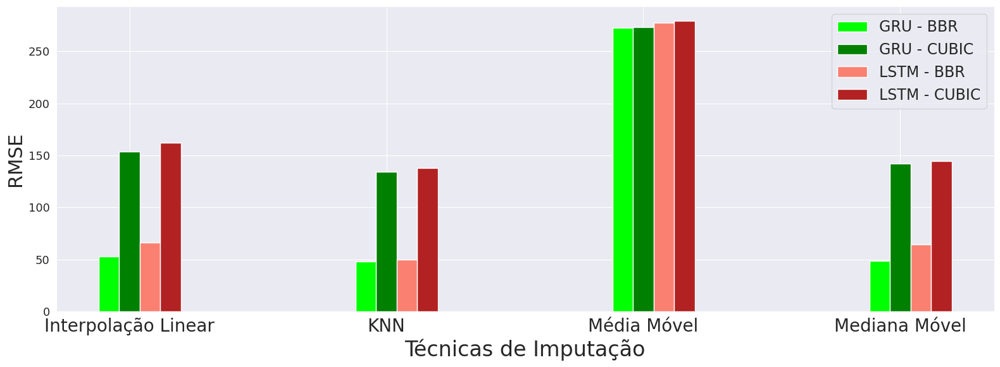

In [16]:
# Results PA-BA RMSE
# resultados referente a: '../../graficos/predicoes/round_2/evaluation_rmse_mae_2.json' que eh
# resultado do treinamento com os hyperparametros em indicados em: '../../graficos/predicoes/round_2/hyperparams_2.txt'

import json
import matplotlib.pyplot as plt
import numpy as np


json_data = """
{
    "Interpolação Linear": [
      {"RMSE": 49.1656595492494, "MODELO": "GRU", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 50.895106296664906, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 52.89093576345165, "MODELO": "GRU", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 66.27586771760345, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 163.7536402553969, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 164.4494189110069, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 153.7524221737528, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PR-AM"},
      {"RMSE": 162.36095430547388, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PR-AM"}
    ],
    "KNN": [
      {"RMSE": 58.27211696536066, "MODELO": "GRU", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 61.56397645649821, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 48.2686337382006, "MODELO": "GRU", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 50.11289780679673, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 170.99390286197323, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 171.44232686161416, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 134.13692806013054, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PR-AM"},
      {"RMSE": 137.62774892075163, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PR-AM"}
    ],
    "Média Móvel": [
      {"RMSE": 262.62576432998407, "MODELO": "GRU", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 266.2307921843741, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 272.7989797854411, "MODELO": "GRU", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 277.60481655611756, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 262.497759104749, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 266.94066414611785, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 273.2646414573494, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PR-AM"},
      {"RMSE": 279.2394819182783, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PR-AM"}
    ],
    "Mediana Móvel": [
      {"RMSE": 55.569133774622046, "MODELO": "GRU", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 57.632766506417205, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PA-BA"},
      {"RMSE": 48.40798349140053, "MODELO": "GRU", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 64.51374974475104, "MODELO": "LSTM", "TCP": "BBR", "LINK": "PR-AM"},
      {"RMSE": 251.11487261984317, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 251.0682412804039, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PA-BA"},
      {"RMSE": 141.88601538905303, "MODELO": "GRU", "TCP": "CUBIC", "LINK": "PR-AM"},
      {"RMSE": 144.71893528301663, "MODELO": "LSTM", "TCP": "CUBIC", "LINK": "PR-AM"}
    ]
}
"""

# Carregar o JSON
data = json.loads(json_data)

# Dicionário para armazenar os valores de RMSE por grupo e configuração
rmse_values = {
    'Interpolação Linear': {'GRU_BBR_PR-AM': [], 'LSTM_CUBIC_PR-AM': [], 'LSTM_BBR_PR-AM': [], 'GRU_CUBIC_PR-AM': []},
    'KNN': {'GRU_BBR_PR-AM': [], 'LSTM_CUBIC_PR-AM': [], 'LSTM_BBR_PR-AM': [], 'GRU_CUBIC_PR-AM': []},
    'Média Móvel': {'GRU_BBR_PR-AM': [], 'LSTM_CUBIC_PR-AM': [], 'LSTM_BBR_PR-AM': [], 'GRU_CUBIC_PR-AM': []},
    'Mediana Móvel': {'GRU_BBR_PR-AM': [], 'LSTM_CUBIC_PR-AM': [], 'LSTM_BBR_PR-AM': [], 'GRU_CUBIC_PR-AM': []}
}

# Organizar os valores de RMSE no dicionário
for group, values in data.items():
    for item in values:
        rmse = item['RMSE']
        modelo = item['MODELO']
        tcp = item['TCP']
        link = item['LINK']
        
        if modelo == 'GRU' and tcp == 'BBR' and link == 'PR-AM':
            rmse_values[group]['GRU_BBR_PR-AM'].append(rmse)
        elif modelo == 'LSTM' and tcp == 'CUBIC' and link == 'PR-AM':
            rmse_values[group]['LSTM_CUBIC_PR-AM'].append(rmse)
        elif modelo == 'LSTM' and tcp == 'BBR' and link == 'PR-AM':
            rmse_values[group]['LSTM_BBR_PR-AM'].append(rmse)
        elif modelo == 'GRU' and tcp == 'CUBIC' and link == 'PR-AM':
            rmse_values[group]['GRU_CUBIC_PR-AM'].append(rmse)

# Criar o gráfico de barras
labels = list(rmse_values.keys())
x = np.arange(len(labels))
width = 0.08

fig, ax = plt.subplots()

# Adicionar as barras
bars1 = ax.bar(x - width, [np.mean(rmse_values[group]['GRU_BBR_PR-AM']) for group in labels], width, label='GRU - BBR', color='lime')
bars2 = ax.bar(x, [np.mean(rmse_values[group]['GRU_CUBIC_PR-AM']) for group in labels], width, label='GRU - CUBIC', color='green')
bars3 = ax.bar(x + width, [np.mean(rmse_values[group]['LSTM_BBR_PR-AM']) for group in labels], width, label='LSTM - BBR', color='salmon')
bars4 = ax.bar(x + 2*width, [np.mean(rmse_values[group]['LSTM_CUBIC_PR-AM']) for group in labels], width, label='LSTM - CUBIC', color='firebrick')

# Configurações do gráfico
ax.set_xlabel('Técnicas de Imputação', size= 24)
ax.set_ylabel('RMSE', size = 22)
# ax.set_title('RMSE - Ponto de Comunicação PR-AM', size = 24)
ax.set_xticks(x)
ax.set_xticklabels(labels, size = 20)
ax.legend()
ax.legend(fontsize = 17)


# plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()